## Final Project Submission

* Student name: **William Dougherty**
* Student pace: **self paced**
* Scheduled project review date/time: **June 3, 2021 | 2:30pm - 3:30pm**
* Instructor name: **Jeff Herman**
* Blog post URL: **TBD**
* Presentation Video URL: https://youtu.be/HAOn-4t6bqE


# Introduction

###  Business Problem

For this project, I'll attempt to build some linear-regression models to predict house prices in King County (Washington State, which contains Seattle).

My focus will be on providing modelling data that will help a fledgling regional real estate website, á lá Zillow.com, design an algorithm to help customers determine their home's value, without having had a professional appraisal, and help give them a ballpark figure as a starting point. This could also help them find out what their home might be worth if they adjusted certain values, which could inform possible renovations before deciding to sell.

Since most people are not real estate experts or appraisers, I'd like to focus on features that are either able to be easily given by the home owner, or can be calculated/estimated by the website.

At the end, I'll give my recommendations and insights based on my modelling results.

I'll attempt to answer these primary questions:

1. What features are the best predictors of home price?
2. What is the most understandable/useable model that can be built with those predictors?
3. What tools can be built using this model?
4. What additional functions could be developed to make this better or keep it relevant in the future?

<a id="contents"></a>
# Contents

### I.   [Obtain Data](#obtain)  
### II.  [Scrub Data](#scrub)  
### III. [Explore Data](#explore)  
### IV.  [Model Data](#model)
### V.   [Interpret Data](#interpret)  
### VI.  [Conclusions](#conclusions)
### VII.  [Appendix](#appendix)

<a id="obtain"></a>
## I. Obtain Data
[Back to Top](#contents) | [Next Section](#scrub)

1. Importing data file `kc_house_data.csv` and needed packages
2. Using `dataprep` package to see basic stats


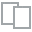
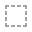
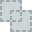
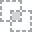
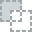
...
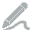
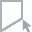
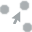
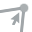
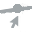

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style('darkgrid')
sns.set_context('talk')
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from statsmodels.stats.diagnostic import het_breuschpagan
data = pd.read_csv('kc_house_data.csv')

from dataprep.eda import plot
plot(data)

<a id="scrub"></a>
## II. Scrub Data
[Back to Top](#contents) | [Previous Section](#obtain) | [Next Section](#explore)

1. Investigating columns
2. Dealing with missing/invalid values

In [2]:
# Sorting the rows by price will allow easier plotting of residuals across price values later on
data = data.sort_values(by='price').reset_index().drop(['index'], axis=1)
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,40000362,5/6/2014,78000.0,2,1.00,780,16344,1.0,0.0,0.0,...,5,780,0.0,1942,NaN,98168,47.4739,-122.280,1700,10387
1,8658300340,5/23/2014,80000.0,1,0.75,430,5050,1.0,NaN,0.0,...,4,430,0.0,1912,0.0,98014,47.6499,-121.909,1200,7500
2,3028200080,3/24/2015,81000.0,2,1.00,730,9975,1.0,NaN,0.0,...,5,730,0.0,1943,0.0,98168,47.4808,-122.315,860,9000
3,3883800011,11/5/2014,82000.0,3,1.00,860,10426,1.0,0.0,0.0,...,6,860,0.0,1954,0.0,98146,47.4987,-122.341,1140,11250
4,1623049041,5/8/2014,82500.0,2,1.00,520,22334,1.0,0.0,0.0,...,5,520,0.0,1951,0.0,98168,47.4799,-122.296,1572,10570


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [4]:
# We need to work on: date, waterfront, view, sqft_basement, and yr_renovated

In [5]:
# Converting 'date' column to a functional datetime object
data['date'] = pd.to_datetime(data['date'], infer_datetime_format=True)
data['date'].sort_values()

3847    2014-05-02
3826    2014-05-02
3923    2014-05-02
14123   2014-05-02
14037   2014-05-02
           ...    
11762   2015-05-14
19192   2015-05-14
10781   2015-05-15
10566   2015-05-24
20831   2015-05-27
Name: date, Length: 21597, dtype: datetime64[ns]

In [6]:
# Since waterfront/view data is ordinal (0-1, 0-5), missing values will be assumed to be 0
data['waterfront'] = data['waterfront'].fillna(0)
data['view'] = data['view'].fillna(0)

In [7]:
# Converting '?' values to 0 for basement square footage, and casting as float values
data['sqft_basement'] = data['sqft_basement'].replace('?', '0').astype('float')

In [8]:
data.sort_values('yr_renovated')['yr_renovated'].unique()

array([   0., 1934., 1940., 1944., 1945., 1946., 1948., 1950., 1951.,
       1953., 1954., 1955., 1956., 1957., 1958., 1959., 1960., 1962.,
       1963., 1964., 1965., 1967., 1968., 1969., 1970., 1971., 1972.,
       1973., 1974., 1975., 1976., 1977., 1978., 1979., 1980., 1981.,
       1982., 1983., 1984., 1985., 1986., 1987., 1988., 1989., 1990.,
       1991., 1992., 1993., 1994., 1995., 1996., 1997., 1998., 1999.,
       2000., 2001., 2002., 2003., 2004., 2005., 2006., 2007., 2008.,
       2009., 2010., 2011., 2012., 2013., 2014., 2015.,   nan])

In [9]:
# If value is 0, I'm assuming that the house has never been renovated;
# Thus I'll set it to the yr_built value
# Then I'll create a new column, 'since_reno', with the number of years since the renovation
# calculated by subtracting the yr_renovated from 2016, so the lowest value will be 1

In [10]:
len(data[data['yr_renovated'] > 0])

744

In [11]:
data['yr_renovated'].replace(0, np.nan, inplace=True)
data['yr_renovated'].fillna(data['yr_built'], inplace=True)
data['since_reno'] = 2016 - data['yr_renovated']
data['since_reno'].describe()

count    21597.000000
mean        43.054869
std         28.945393
min          1.000000
25%         17.000000
50%         39.000000
75%         62.000000
max        116.000000
Name: since_reno, dtype: float64

In [12]:
# What about houses with lot sizes smaller than they should be? This could mean invalid home types
# (apartments, other outliers) that would not fit into the 'house' category for this project

# So if the lot size sqft is smaller than the above-ground sqft (divided by the # of floors),
# then it's probably an invalid home entry.

data[data['sqft_lot'] < (data['sqft_above'] / data['floors'])]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,since_reno
7487,3277800845,2014-07-11,370000.0,3,1.00,1170,1105,1.0,0.0,0.0,...,1170,0.0,1965,1965.0,98126,47.5448,-122.375,1380,1399,51.0
13348,2062600020,2014-07-08,530000.0,2,2.50,1785,779,2.0,0.0,0.0,...,1595,190.0,1975,1975.0,98004,47.5959,-122.198,1780,794,41.0
17271,9828702895,2014-10-22,700000.0,4,1.75,2420,520,1.5,0.0,0.0,...,2420,0.0,1900,1900.0,98112,47.6209,-122.302,1200,1170,116.0
20655,2559950110,2015-04-22,1230000.0,2,2.50,2470,609,3.0,0.0,0.0,...,1910,560.0,2011,2011.0,98112,47.6182,-122.312,2440,1229,5.0


In [13]:
# So let's drop these entries:
bad_indices = list(data[data['sqft_lot'] < (data['sqft_above'] / data['floors'])].index)

data.drop(bad_indices, inplace=True)

In [14]:
data[data['sqft_lot'] < (data['sqft_above'] / data['floors'])]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,since_reno


<a id="explore"></a>
## III. Explore Data
[Back to Top](#contents) | [Previous Section](#scrub) | [Next Section](#model)

1. Investigating columns, looking for outliers (large delta between 75% and max, for ex.)
2. Investigate target (price) and decide how to subset the data for modelling

In [15]:
data.iloc[:,:8].describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors
count,2.159300e+04,2.159300e+04,21593.000000,21593.000000,21593.000000,2.159300e+04,21593.000000
mean,4.580502e+09,5.402656e+05,3.373315,2.115859,2080.343908,1.510207e+04,1.494026
std,2.876683e+09,3.673687e+05,0.926277,0.769005,918.161323,4.141601e+04,0.539614
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.720000e+02,1.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000
50%,3.904931e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.620000e+03,1.500000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068700e+04,2.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000


In [16]:
data.iloc[:,8:15].describe()

,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built
count,21593.000000,21593.000000,21593.000000,21593.000000,21593.000000,21593.000000,21593.000000
mean,0.006761,0.233224,3.409901,7.657852,1788.599592,285.734775,1971.001204
std,0.081951,0.764737,0.650582,1.173062,827.813114,439.847528,29.372679
min,0.000000,0.000000,1.000000,3.000000,370.000000,0.000000,1900.000000
25%,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000
50%,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000
75%,0.000000,0.000000,4.000000,8.000000,2210.000000,550.000000,1997.000000
max,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000


In [17]:
data.iloc[:,15:].describe()

,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,since_reno
count,21593.000000,21593.000000,21593.000000,21593.000000,21593.000000,21593.000000,21593.000000
mean,1972.947020,98077.949891,47.560087,-122.213967,1986.673413,12760.434261,43.052980
std,28.942605,53.513660,0.138563,0.140729,685.252204,27276.510178,28.942605
min,1900.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,1.000000
25%,1954.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000,17.000000
50%,1977.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000,39.000000
75%,1999.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,62.000000
max,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,116.000000


In [18]:
# First, looking at the correlation of variables with the target:
data.corr().iloc[:,1:2]

,price
id,-0.016762
price,1.000000
bedrooms,0.308956
bathrooms,0.525924
sqft_living,0.701938
sqft_lot,0.089915
floors,0.256622
waterfront,0.264337
view,0.393562
condition,0.036114


In [19]:
# Bathrooms, sqft_living, grade, sqft_above, and sqft_living15 all correlate highly with price

In [20]:
# Check more granular quantiles for beds/baths

quants = [.8, .9, .95, .99, .999]


for col in ['bedrooms', 'bathrooms']:
    print(col + ":")
    for q in quants:
        print(str(q) + ': ' + str(data[col].quantile(q)))

bedrooms:
0.8: 4.0
0.9: 4.0
0.95: 5.0
0.99: 6.0
0.999: 8.0
bathrooms:
0.8: 2.5
0.9: 3.0
0.95: 3.5
0.99: 4.25
0.999: 5.5


In [21]:
data[data['bedrooms'] > 8]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,since_reno
10693,424049043,2014-08-11,450000.0,9,7.50,4050,6504,2.0,0.0,0.0,...,4050,0.0,1996,1996.0,98144,47.5923,-122.301,1448,3866,20.0
12987,1773100755,2014-08-21,520000.0,11,3.00,3000,4960,2.0,0.0,0.0,...,2400,600.0,1918,1999.0,98106,47.5560,-122.363,1420,4960,17.0
15232,1997200215,2014-05-07,599999.0,9,4.50,3830,6988,2.5,0.0,0.0,...,2450,1380.0,1938,1938.0,98103,47.6927,-122.338,1460,6291,78.0
16140,2402100895,2014-06-25,640000.0,33,1.75,1620,6000,1.0,0.0,0.0,...,1040,580.0,1947,1947.0,98103,47.6878,-122.331,1330,4700,69.0
16289,5566100170,2014-10-29,650000.0,10,2.00,3610,11914,2.0,0.0,0.0,...,3010,600.0,1958,1958.0,98006,47.5705,-122.175,2040,11914,58.0
16536,8812401450,2014-12-29,660000.0,10,3.00,2920,3745,2.0,0.0,0.0,...,1860,1060.0,1913,1913.0,98105,47.6635,-122.320,1810,3745,103.0
17240,2902200015,2015-01-06,700000.0,9,3.00,3680,4400,2.0,0.0,0.0,...,2830,850.0,1908,1908.0,98102,47.6374,-122.324,1960,2450,108.0
19758,8823901445,2015-03-13,934000.0,9,3.00,2820,4480,2.0,0.0,0.0,...,1880,940.0,1918,1918.0,98105,47.6654,-122.307,2460,4400,98.0
20482,627300145,2014-08-14,1150000.0,10,5.25,4590,10920,1.0,0.0,2.0,...,2500,2090.0,2008,2008.0,98004,47.5861,-122.113,2730,10400,8.0
20769,9822700190,2014-08-08,1280000.0,9,4.50,3650,5000,2.0,0.0,0.0,...,2530,1120.0,1915,2010.0,98105,47.6604,-122.289,2510,5000,6.0


In [22]:
data[data['bathrooms'] > 5.5]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,since_reno
10693,424049043,2014-08-11,450000.0,9,7.50,4050,6504,2.0,0.0,0.0,...,4050,0.0,1996,1996.0,98144,47.5923,-122.301,1448,3866,20.0
13614,6744700427,2014-05-07,540000.0,7,5.75,3700,7647,2.0,0.0,1.0,...,3700,0.0,1948,1984.0,98155,47.7393,-122.289,2510,7479,32.0
18626,9175600025,2014-10-07,800000.0,7,6.75,7480,41664,2.0,0.0,2.0,...,5080,2400.0,1953,1953.0,98166,47.4643,-122.368,2810,33190,63.0
19563,2424059170,2015-02-19,900000.0,5,6.00,7120,40806,2.0,0.0,4.0,...,5480,1640.0,2007,2007.0,98006,47.5451,-122.114,3440,36859,9.0
20545,424069279,2015-03-28,1180000.0,6,6.50,6260,10955,2.0,0.0,0.0,...,4840,1420.0,2007,2007.0,98075,47.5947,-122.039,2710,12550,9.0
21053,8835770170,2014-08-22,1490000.0,5,6.00,6880,279968,2.0,0.0,3.0,...,4070,2810.0,2007,2007.0,98045,47.4624,-121.779,4690,256803,9.0
21359,1630700380,2015-01-30,1920000.0,5,5.75,7730,230868,2.0,0.0,0.0,...,6660,1070.0,2004,2004.0,98077,47.7615,-122.084,2660,39292,12.0
21366,2626069030,2015-02-09,1940000.0,4,5.75,7220,223462,2.0,0.0,4.0,...,6220,1000.0,2000,2000.0,98053,47.7097,-122.013,2680,7593,16.0
21418,685000115,2014-10-07,2150000.0,8,6.00,4340,9415,2.0,0.0,0.0,...,4340,0.0,1967,1967.0,98004,47.6316,-122.202,2050,9100,49.0
21440,2524069097,2014-05-09,2240000.0,5,6.50,7270,130017,2.0,0.0,0.0,...,6420,850.0,2010,2010.0,98027,47.5371,-121.982,1800,44890,6.0


In [23]:
# 33 bedrooms in a $640,000 / 1,620 sqft house???
# This is definitely an outlier, let's remove it from the data
data = data[data['bedrooms'] < 33]
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,since_reno
count,2.159200e+04,2.159200e+04,21592.000000,21592.000000,21592.000000,2.159200e+04,21592.000000,21592.000000,21592.000000,21592.000000,...,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000
mean,4.580603e+09,5.402610e+05,3.371943,2.115876,2080.365228,1.510249e+04,1.494049,0.006762,0.233235,3.409828,...,1788.634263,285.721147,1971.002316,1972.948222,98077.948731,47.560081,-122.213962,1986.703825,12760.807568,43.051778
std,2.876711e+09,3.673766e+05,0.904087,0.769019,918.177240,4.141692e+04,0.539616,0.081953,0.764753,0.650507,...,827.816606,439.853155,29.372905,28.942737,53.514628,0.138564,0.140730,685.253500,27277.086673,28.942737
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.720000e+02,1.000000,0.000000,0.000000,1.000000,...,370.000000,0.000000,1900.000000,1900.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,1.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,...,1190.000000,0.000000,1951.000000,1954.000000,98033.000000,47.471075,-122.328000,1490.000000,5100.000000,17.000000
50%,3.904931e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.620000e+03,1.500000,0.000000,0.000000,3.000000,...,1560.000000,0.000000,1975.000000,1977.000000,98065.000000,47.571800,-122.230500,1840.000000,7620.000000,39.000000
75%,7.308950e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068725e+04,2.000000,0.000000,0.000000,4.000000,...,2210.000000,550.000000,1997.000000,1999.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,62.000000
max,9.900000e+09,7.700000e+06,11.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,...,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,116.000000


In [24]:
# create df1 as the dataframe to start analyzing, and add a log-transformed price column
df1 = data.copy()
df1['price_log'] = np.log(df1['price'])

In [25]:
def box_it(ind, dep, df, hue=None):
    """
    Quick shortcut to plot a seaborn box-plot of an independent categorical/ordinal variable 
    against a dependent (continuous) variable, with an option for breaking the independent 
    variable out by another variable (hue).
    
    ind: label of independent variable (x-axis)
    dep: label of dependent variable (y-axis)
    df: dataframe
    hue: secondary independent variable; default=None
    """
    plt.figure(figsize=(10,8))
    sns.boxplot(x=ind,
                y=dep,
                data=df,
                hue=hue,
                palette='Set2')
    plt.show()

In [26]:
def scatter_it(ind, dep, df, hue=None):
    """
    Quick shortcut to plot a seaborn scatter-plot of an independent continuous variable 
    against a dependent (continuous) variable, with an option for breaking the independent 
    variable out by another variable (hue).
    
    ind: label of independent variable (x-axis)
    dep: label of dependent variable (y-axis)
    df: dataframe
    hue: secondary independent variable; default=None
    """
    plt.figure(figsize=(10,8))
    sns.scatterplot(x=ind,
                y=dep,
                data=df,
                hue=hue,
                alpha=.1)
    plt.show()

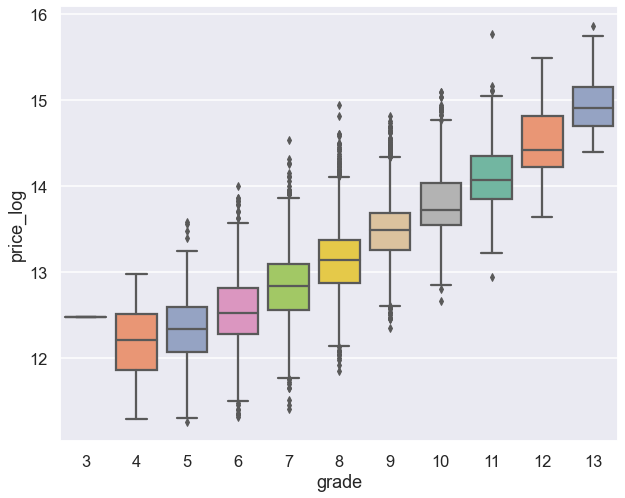

In [27]:
box_it('grade', 'price_log', df1)

(array([1.000e+00, 2.700e+01, 2.420e+02, 2.038e+03, 8.970e+03, 6.065e+03,
        2.615e+03, 1.134e+03, 3.980e+02, 1.020e+02]),
 array([ 3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.]),
 <BarContainer object of 10 artists>)

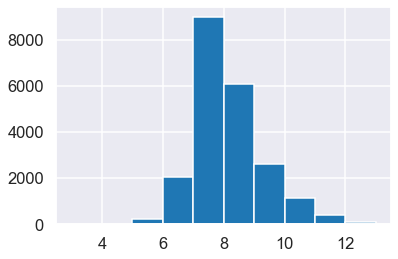

In [28]:
plt.hist(x='grade', data=df1)

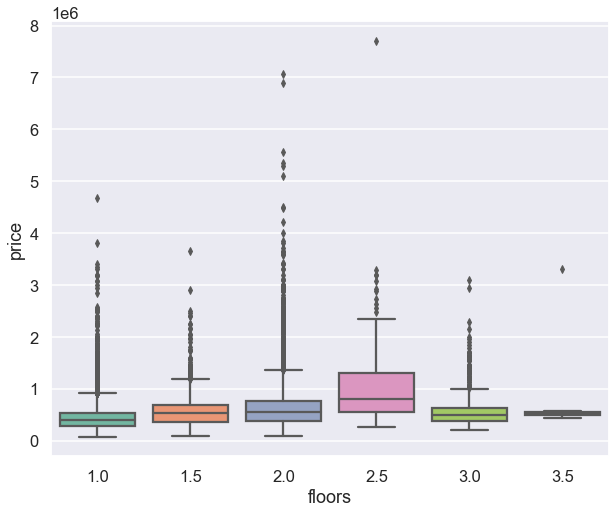

In [29]:
box_it('floors', 'price', df1)

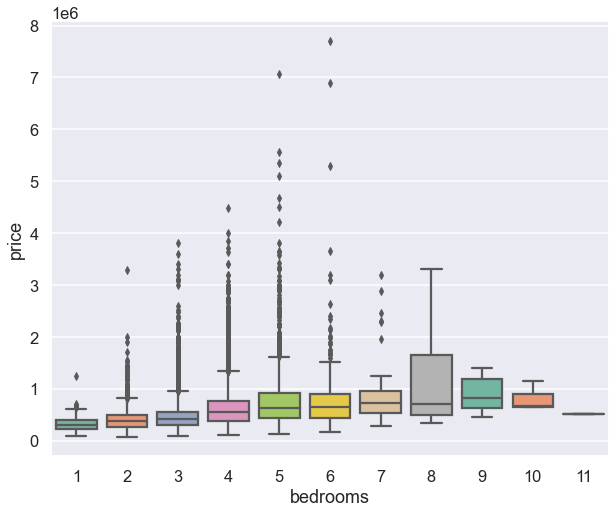

In [30]:
box_it('bedrooms', 'price', df1)

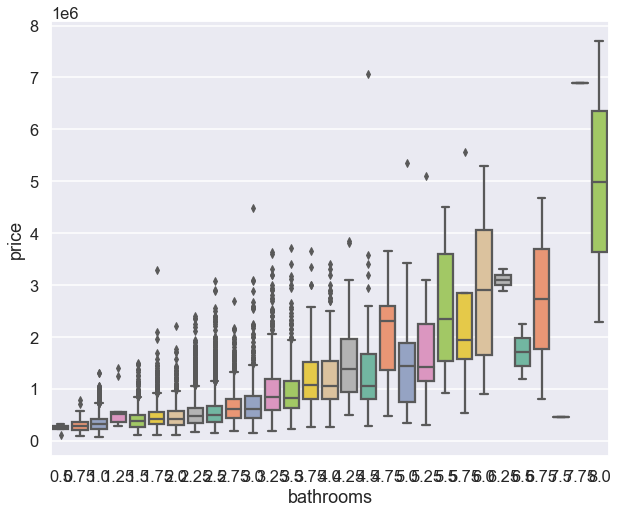

In [31]:
box_it('bathrooms', 'price', df1)

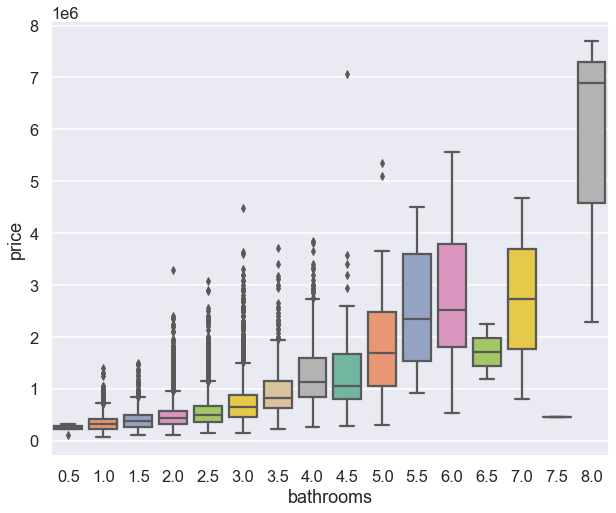

In [32]:
df1['bathrooms'] = round((df1['bathrooms']*2),0)/2
df1 = df1[df1['bathrooms'] > 0]
box_it('bathrooms', 'price', df1)

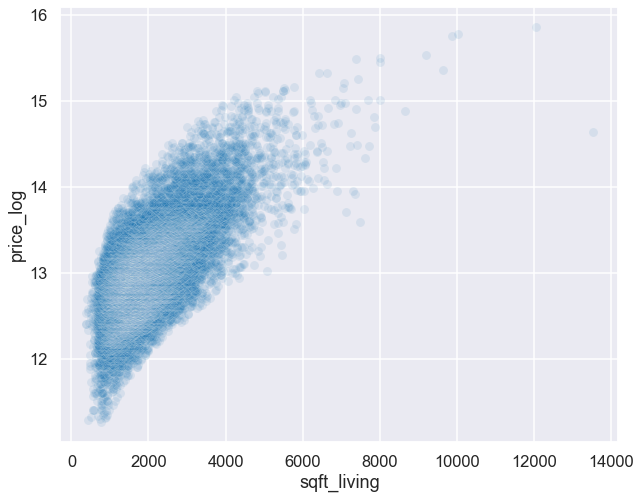

In [33]:
scatter_it('sqft_living', 'price_log', df1)

<a id="model"></a>
## IV. Model Data
[Back to Top](#contents) | [Previous Section](#explore) | [Next Section](#interpret)

1. Initial modeling (naive) and whittling of features
2. Ground-up modeling (naive)
3. Feature engineering / encoding

* First, I'll define a few different functions to automate modelling:

In [34]:
def check_model(Xs, ys):
    """
    Shortcut function for running a battery of linear regression models and tests.
    
    2 Arguments:
    
    Xs: dataframe of independent variables' values
    ys: series/array of dependent variable values
    
    Displays results and plots of several modeling/testing components:
    
    - Linear regression - 5-fold cross validation
        - With mean r-squared value
    - Linear regression - Statsmodels WLS summary
    - .info(), .describe(), and seaborn heatmap of Xs statistics
    - Breusch-pagan test for heterscedasticity of residuals
    - Plot of model vs. actual y-values, for visual inspection of het-sced.
    - QQ plot
    - Histogram of residuals
    - Random training/testing split
        - plots of training and testing y-values vs predicted
        - Bias and variance values
    """
    
    # 5-fold cross-validation test
    # displays average of folds' R-squared values
    linreg = LinearRegression()
    Xs = sm.add_constant(Xs)
    x_shuffle = Xs.sample(frac=1, random_state=666)
    y_shuffle = ys.sample(frac=1, random_state=666)
    mean_r2 = np.mean(cross_val_score(linreg, x_shuffle, y_shuffle, cv=5,  scoring='r2'))
    mean_rmse = -np.mean(cross_val_score(linreg, x_shuffle, y_shuffle, cv=5,  scoring='neg_mean_squared_error'))
    print(f'Cross-validation R-squared mean: {mean_r2}')
    print(f'Cross-validation RMSE mean: {mean_rmse}')
    # Display statsmodels summary
    model = sm.OLS(ys,Xs).fit()
    display(model.summary())
    
    # Display X values .info(), .describe(), and heatmap
    display(Xs.info())
    display(Xs.describe())
    
    plt.figure(figsize=(6,5))
    plt.title('Correlation Heatmap of Features')
    sns.heatmap(Xs.corr(), center=0)
    plt.show();
    
    # Breusch-pagan Test for heterscedasticity
    print("B-P het-sced Test p-value:", het_breuschpagan(model.resid, model.model.exog)[1])
    
    # Visual heteroscedasticity plot
    fig = plt.figure(figsize=(10,5))
    sns.scatterplot(x=np.arange(len(model.resid)), y=model.resid, alpha=.05)
    plt.axhline(0)
    if ys.max() > 100000:
        plt.ylim(-500000,500000)
    elif ys.max() < 20:
        plt.ylim(-2,2)
    plt.title('Residuals for all entries')
    plt.show();

    # QQ plot
    fig = plt.figure(figsize=(8,8))
    ax = fig.gca()
    sm.graphics.qqplot(model.resid, dist=stats.norm, line='s', fit=True, ax=ax, alpha=.1)
    plt.title('QQ Plot - Normality test')
    plt.show();

    # Residuals histogram
    fig = plt.figure(figsize=(8,6))
    sns.histplot(model.resid, kde=True)
    plt.axvline(model.resid.mean(), color='r')
    plt.title('Residuals Histogram')
    plt.show();

    # Random train-test split
    X_train, X_test, y_train, y_test = train_test_split(Xs, ys, test_size=.2, random_state=666)
    linreg = LinearRegression()
    linreg.fit(X_train, y_train)
    
    lm_train_predictions = linreg.predict(X_train)
    lm_test_predictions = linreg.predict(X_test)

    # Plot of model vs training set
    plt.figure(figsize=(8, 5))
    plt.scatter(y_train, lm_train_predictions, label='Model', alpha=.05)
    plt.plot(y_train, y_train, label='Actual data')
    plt.title('Model vs data for training set')
    plt.legend()
    plt.show()

    # Plot of model vs test set
    plt.figure(figsize=(8, 5))
    plt.scatter(y_test, lm_test_predictions, label='Model', alpha=.05)
    plt.plot(y_test, y_test, label='Actual data')
    plt.title('Model vs data for test set')
    plt.legend()
    plt.show()

    # Bias and variance for train vs test sets
    b1 = bias(y_train, lm_train_predictions)
    v1 = variance(lm_train_predictions)
    
    b2 = bias(y_test, lm_test_predictions) 
    v2 = variance(lm_test_predictions) 
    print(f'Train vs Test bias:\n{b1} | {b2}')
    print(f'Train vs Test variance:\n{v1} | {v2}\n')
    
    return model

In [35]:
def bias(y, y_hat):
    """
    Simple function for computing bias.
    
    2 Arguments:
    y: array of known y-values
    y-hat: array of predicted y-values
    
    Returns the mean of (y_hat - y) for each value
    """
    return np.mean(y_hat - y)

def variance(y_hat):
    """
    Simple function for computing variance.
    
    1 Argument:
    y-hat: array of predicted y-values
    
    Returns the variance of the set.
    """
    return np.mean([yi**2 for yi in y_hat]) - np.mean(y_hat)**2

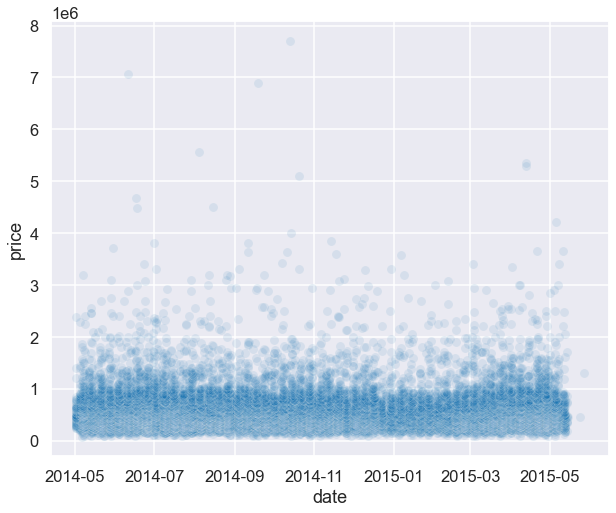

In [36]:
# Before modelling, dropping a few features that I think will likely be unneeded/redundant
# Date?
scatter_it('date', 'price', df1)

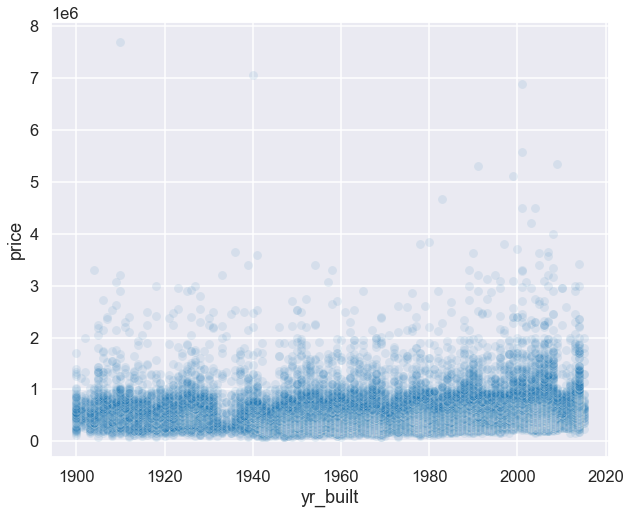

In [37]:
# yr_built?
scatter_it('yr_built', 'price', df1)

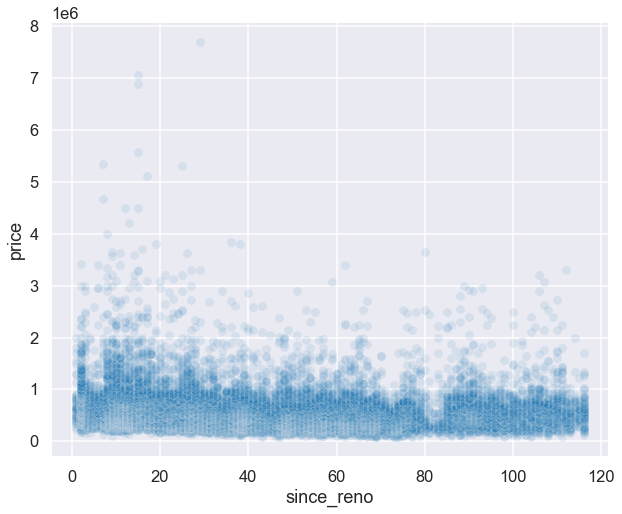

In [38]:
# checked against since_reno
scatter_it('since_reno', 'price', df1)

In [39]:
# Since 'date' is a wash, and 'yr_built' / 'since_reno' don't have much of a pattern,
# I'll drop all three of those before getting started.

In [40]:
df2 = df1.drop(['id', 'date', 'yr_built', 'since_reno', 'yr_renovated'], axis=1)
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21592 non-null  float64
 1   bedrooms       21592 non-null  int64  
 2   bathrooms      21592 non-null  float64
 3   sqft_living    21592 non-null  int64  
 4   sqft_lot       21592 non-null  int64  
 5   floors         21592 non-null  float64
 6   waterfront     21592 non-null  float64
 7   view           21592 non-null  float64
 8   condition      21592 non-null  int64  
 9   grade          21592 non-null  int64  
 10  sqft_above     21592 non-null  int64  
 11  sqft_basement  21592 non-null  float64
 12  zipcode        21592 non-null  int64  
 13  lat            21592 non-null  float64
 14  long           21592 non-null  float64
 15  sqft_living15  21592 non-null  int64  
 16  sqft_lot15     21592 non-null  int64  
 17  price_log      21592 non-null  float64
dtypes: flo

Cross-validation R-squared mean: 0.6754553830764447
Cross-validation RMSE mean: 209013.550872812


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.677
Method:                 Least Squares   F-statistic:                     2835.
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        10:43:00   Log-Likelihood:            -2.9510e+05
No. Observations:               21592   AIC:                         5.902e+05
Df Residuals:                   21575   BIC:                         5.904e+05
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -3.253e+07   2.84e+06    -11.453      0.000   -3.81e+07    -2.7e+07
bedrooms      -3.429e+04   2049.828    -16.729      0.000   -3.83e+04   -3.03e+04
bathrooms      1627.5695   3088.398      0.527      0.598   -4425.920    7681.059
sqft_living     134.0592     18.722      7.161      0.000      97.363     170.755
sqft_lot          0.2020      0.050      4.070      0.000       0.105       0.299
floors        -2.102e+04   3570.278     -5.888      0.000    -2.8e+04    -1.4e+04
waterfront      6.25e+05   1.88e+04     33.268      0.000    5.88e+05    6.62e+05
view           6.174e+04   2189.073     28.202      0.000    5.74e+04     6.6e+04
condition      5.113e+04   2302.192     22.209      0.000    4.66e+04    5.56e+04
grade          7.796e+04   2180.546     35.751      0.000    7.37e+04    8.22e+04
sqft_above       73.2812     18.726      3.913      0.000      36.576     109.986
sqft_basement    41.7778     18.563      2.251      0.024       5.393      78.163
zipcode        -427.0025     33.912    -12.591      0.000    -493.473    -360.532
lat            6.746e+05   1.09e+04     61.659      0.000    6.53e+05    6.96e+05
long          -3.416e+05   1.32e+04    -25.822      0.000   -3.68e+05   -3.16e+05
sqft_living15    22.3494      3.574      6.253      0.000      15.344      29.355
sqft_lot15       -0.4194      0.076     -5.515      0.000      -0.568      -0.270
==============================================================================
Omnibus:                    17939.644   Durbin-Watson:                   1.105
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1620528.843
Skew:                           3.468   Prob(JB):                         0.00
Kurtosis:                      44.871   Cond. No.                     2.01e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.01e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   const          21592 non-null  float64
 1   bedrooms       21592 non-null  int64  
 2   bathrooms      21592 non-null  float64
 3   sqft_living    21592 non-null  int64  
 4   sqft_lot       21592 non-null  int64  
 5   floors         21592 non-null  float64
 6   waterfront     21592 non-null  float64
 7   view           21592 non-null  float64
 8   condition      21592 non-null  int64  
 9   grade          21592 non-null  int64  
 10  sqft_above     21592 non-null  int64  
 11  sqft_basement  21592 non-null  float64
 12  zipcode        21592 non-null  int64  
 13  lat            21592 non-null  float64
 14  long           21592 non-null  float64
 15  sqft_living15  21592 non-null  int64  
 16  sqft_lot15     21592 non-null  int64  
dtypes: float64(8), int64(9)
memory usage: 3.6 MB


None

,const,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,zipcode,lat,long,sqft_living15,sqft_lot15
count,21592.0,21592.000000,21592.000000,21592.000000,2.159200e+04,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000
mean,1.0,3.371943,2.136115,2080.365228,1.510249e+04,1.494049,0.006762,0.233235,3.409828,7.657883,1788.634263,285.721147,98077.948731,47.560081,-122.213962,1986.703825,12760.807568
std,0.0,0.904087,0.763223,918.177240,4.141692e+04,0.539616,0.081953,0.764753,0.650507,1.173081,827.816606,439.853155,53.514628,0.138564,0.140730,685.253500,27277.086673
min,1.0,1.000000,0.500000,370.000000,5.720000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,1.0,3.000000,2.000000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,98033.000000,47.471075,-122.328000,1490.000000,5100.000000
50%,1.0,3.000000,2.000000,1910.000000,7.620000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,98065.000000,47.571800,-122.230500,1840.000000,7620.000000
75%,1.0,4.000000,2.500000,2550.000000,1.068725e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,550.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,1.0,11.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


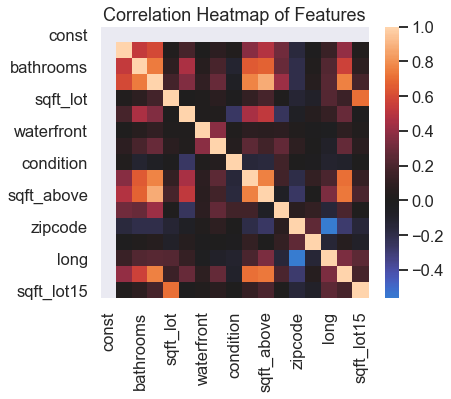

B-P het-sced Test p-value: 0.0


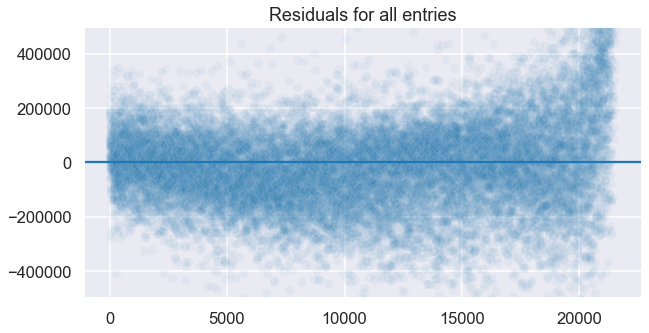

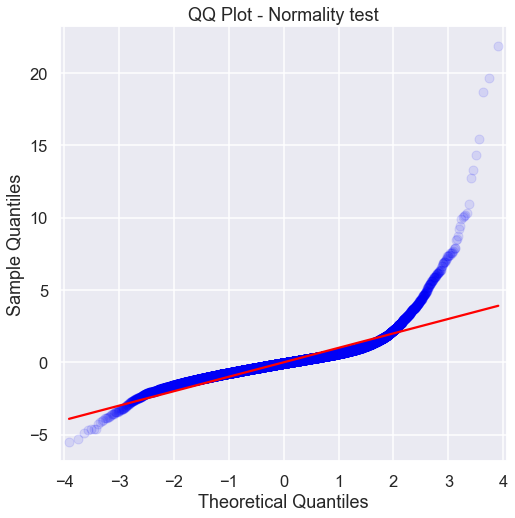

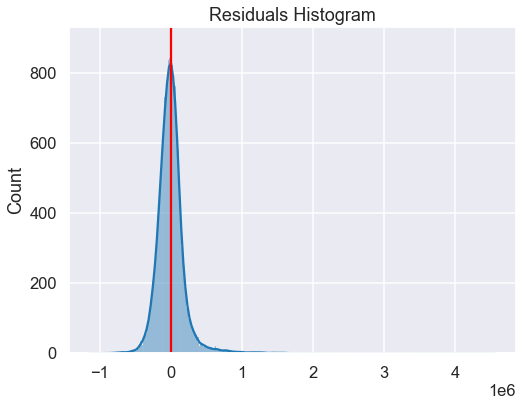

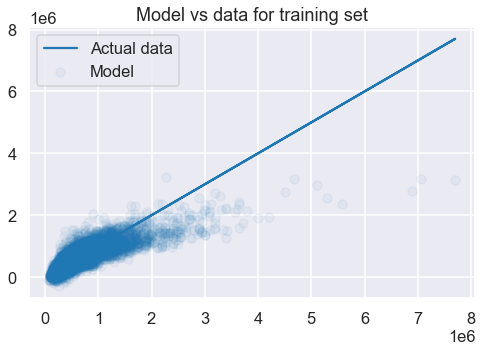

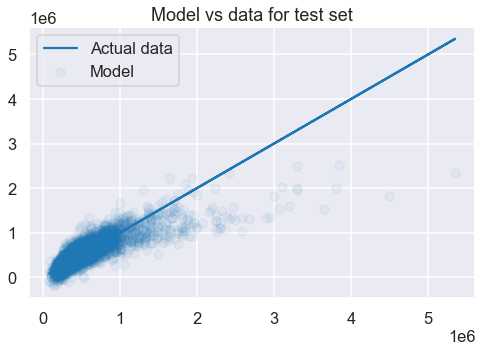

Train vs Test bias:
-2.534763176564177e-08 | -6995.174095824409
Train vs Test variance:
90842836742.55536 | 91012348067.3349



In [41]:
# For each model, I'll create the X (independent variables)
# The y/ylog will remain the same throughout
X = df2.drop(['price_log', 'price'], axis=1).copy()
y = df2['price'].copy()
ylog = df2['price_log'].copy()
model1a = check_model(X, y)

In [42]:
# Since 'sqft_basement' has a very high p-value, I'll try simplifying it to a binary
# has/doesn't have a basement

X['bsmt'] = X['sqft_basement'].apply(lambda x: 1 if x > 0 else 0)
X['bsmt'].value_counts()

0    13278
1     8314
Name: bsmt, dtype: int64

Cross-validation R-squared mean: 0.6754496951916436
Cross-validation RMSE mean: 209016.1362334685


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.677
Method:                 Least Squares   F-statistic:                     3023.
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        10:43:03   Log-Likelihood:            -2.9510e+05
No. Observations:               21592   AIC:                         5.902e+05
Df Residuals:                   21576   BIC:                         5.904e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -3.232e+07   2.84e+06    -11.384      0.000   -3.79e+07   -2.68e+07
bedrooms      -3.412e+04   2013.728    -16.945      0.000   -3.81e+04   -3.02e+04
sqft_living     175.2380      6.081     28.815      0.000     163.318     187.158
sqft_lot          0.2026      0.050      4.082      0.000       0.105       0.300
floors        -2.046e+04   3401.397     -6.016      0.000   -2.71e+04   -1.38e+04
waterfront     6.254e+05   1.88e+04     33.281      0.000    5.89e+05    6.62e+05
view           6.175e+04   2191.295     28.182      0.000    5.75e+04     6.6e+04
condition      5.102e+04   2303.001     22.153      0.000    4.65e+04    5.55e+04
grade          7.806e+04   2165.200     36.053      0.000    7.38e+04    8.23e+04
sqft_above       32.7321      6.816      4.802      0.000      19.372      46.092
zipcode        -428.5189     33.901    -12.640      0.000    -494.967    -362.071
lat            6.745e+05   1.09e+04     61.641      0.000    6.53e+05    6.96e+05
long          -3.412e+05   1.32e+04    -25.771      0.000   -3.67e+05   -3.15e+05
sqft_living15    22.3895      3.571      6.269      0.000      15.389      29.390
sqft_lot15       -0.4221      0.076     -5.552      0.000      -0.571      -0.273
bsmt            726.5448   5218.341      0.139      0.889   -9501.789     1.1e+04
==============================================================================
Omnibus:                    17956.252   Durbin-Watson:                   1.104
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1628086.371
Skew:                           3.472   Prob(JB):                         0.00
Kurtosis:                      44.969   Cond. No.                     2.01e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.01e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   const          21592 non-null  float64
 1   bedrooms       21592 non-null  int64  
 2   sqft_living    21592 non-null  int64  
 3   sqft_lot       21592 non-null  int64  
 4   floors         21592 non-null  float64
 5   waterfront     21592 non-null  float64
 6   view           21592 non-null  float64
 7   condition      21592 non-null  int64  
 8   grade          21592 non-null  int64  
 9   sqft_above     21592 non-null  int64  
 10  zipcode        21592 non-null  int64  
 11  lat            21592 non-null  float64
 12  long           21592 non-null  float64
 13  sqft_living15  21592 non-null  int64  
 14  sqft_lot15     21592 non-null  int64  
 15  bsmt           21592 non-null  int64  
dtypes: float64(6), int64(10)
memory usage: 3.4 MB


None

,const,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,zipcode,lat,long,sqft_living15,sqft_lot15,bsmt
count,21592.0,21592.000000,21592.000000,2.159200e+04,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000
mean,1.0,3.371943,2080.365228,1.510249e+04,1.494049,0.006762,0.233235,3.409828,7.657883,1788.634263,98077.948731,47.560081,-122.213962,1986.703825,12760.807568,0.385050
std,0.0,0.904087,918.177240,4.141692e+04,0.539616,0.081953,0.764753,0.650507,1.173081,827.816606,53.514628,0.138564,0.140730,685.253500,27277.086673,0.486618
min,1.0,1.000000,370.000000,5.720000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,0.000000
25%,1.0,3.000000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,98033.000000,47.471075,-122.328000,1490.000000,5100.000000,0.000000
50%,1.0,3.000000,1910.000000,7.620000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,98065.000000,47.571800,-122.230500,1840.000000,7620.000000,0.000000
75%,1.0,4.000000,2550.000000,1.068725e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,1.000000
max,1.0,11.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,1.000000


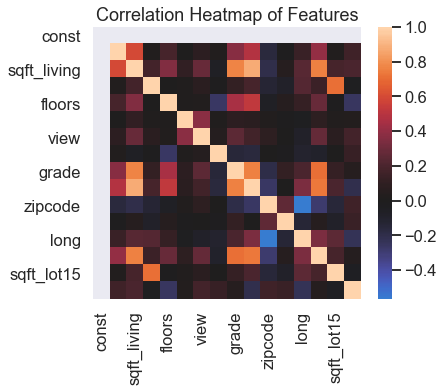

B-P het-sced Test p-value: 0.0


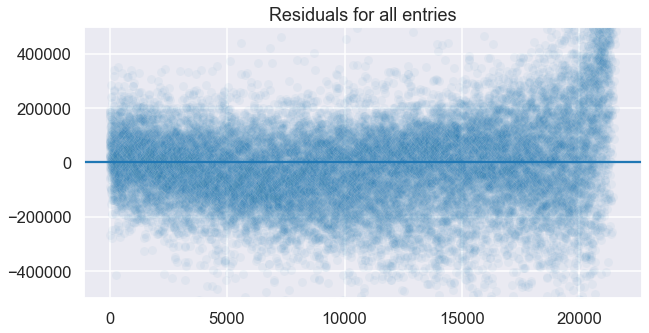

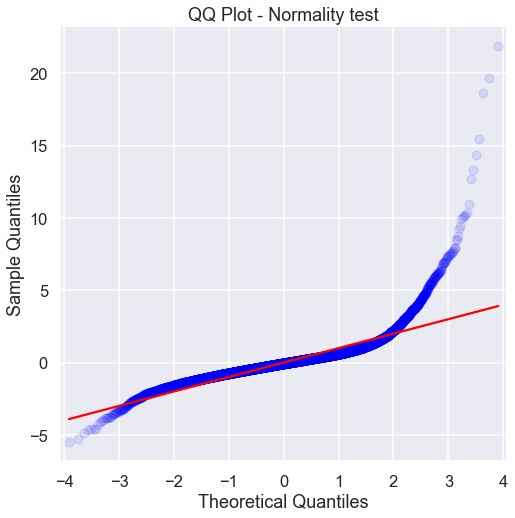

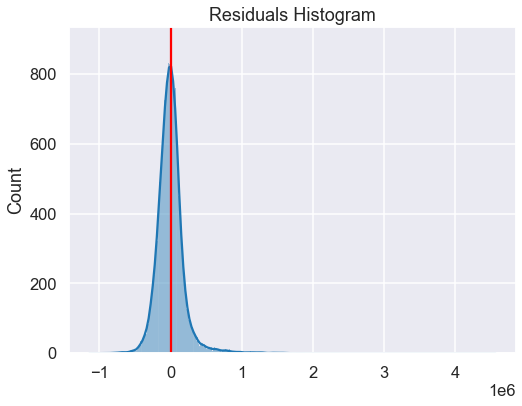

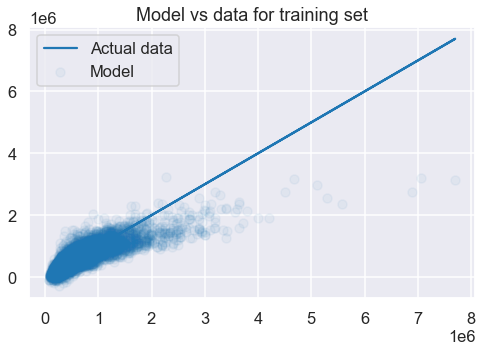

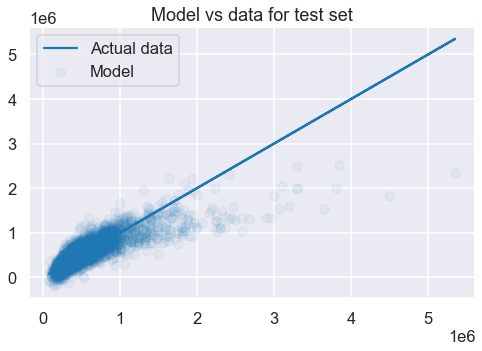

Train vs Test bias:
-2.5190407390745764e-09 | -6951.84692145707
Train vs Test variance:
90825132340.84485 | 90972108403.27197



In [43]:
# I'll also drop bathrooms (high p-value)
X2 = X.drop(['sqft_basement', 'bathrooms'], axis=1)

model1b = check_model(X2, y)

Cross-validation R-squared mean: 0.7516203391406882
Cross-validation RMSE mean: 0.26230435296821303


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.753
Model:                            OLS   Adj. R-squared:                  0.752
Method:                 Least Squares   F-statistic:                     4374.
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        10:43:06   Log-Likelihood:                -1712.3
No. Observations:               21592   AIC:                             3457.
Df Residuals:                   21576   BIC:                             3584.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           -49.4767      3.565    -13.879      0.000     -56.464     -42.489
bedrooms         -0.0062      0.003     -2.450      0.014      -0.011      -0.001
sqft_living       0.0001   7.64e-06     15.080      0.000       0.000       0.000
sqft_lot       5.559e-07   6.23e-08      8.916      0.000    4.34e-07    6.78e-07
floors            0.0449      0.004     10.511      0.000       0.037       0.053
waterfront        0.3933      0.024     16.667      0.000       0.347       0.440
view              0.0752      0.003     27.339      0.000       0.070       0.081
condition         0.0952      0.003     32.927      0.000       0.090       0.101
grade             0.1338      0.003     49.224      0.000       0.129       0.139
sqft_above      7.22e-05   8.56e-06      8.436      0.000    5.54e-05     8.9e-05
zipcode          -0.0005   4.26e-05    -11.269      0.000      -0.001      -0.000
lat               1.4856      0.014    108.118      0.000       1.459       1.513
long             -0.3019      0.017    -18.162      0.000      -0.335      -0.269
sqft_living15  9.646e-05   4.48e-06     21.508      0.000    8.77e-05       0.000
sqft_lot15    -2.968e-07   9.55e-08     -3.108      0.002   -4.84e-07    -1.1e-07
bsmt              0.0911      0.007     13.897      0.000       0.078       0.104
==============================================================================
Omnibus:                      277.495   Durbin-Watson:                   1.456
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              445.545
Skew:                           0.115   Prob(JB):                     1.78e-97
Kurtosis:                       3.665   Cond. No.                     2.01e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.01e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   const          21592 non-null  float64
 1   bedrooms       21592 non-null  int64  
 2   sqft_living    21592 non-null  int64  
 3   sqft_lot       21592 non-null  int64  
 4   floors         21592 non-null  float64
 5   waterfront     21592 non-null  float64
 6   view           21592 non-null  float64
 7   condition      21592 non-null  int64  
 8   grade          21592 non-null  int64  
 9   sqft_above     21592 non-null  int64  
 10  zipcode        21592 non-null  int64  
 11  lat            21592 non-null  float64
 12  long           21592 non-null  float64
 13  sqft_living15  21592 non-null  int64  
 14  sqft_lot15     21592 non-null  int64  
 15  bsmt           21592 non-null  int64  
dtypes: float64(6), int64(10)
memory usage: 3.4 MB


None

,const,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,zipcode,lat,long,sqft_living15,sqft_lot15,bsmt
count,21592.0,21592.000000,21592.000000,2.159200e+04,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000
mean,1.0,3.371943,2080.365228,1.510249e+04,1.494049,0.006762,0.233235,3.409828,7.657883,1788.634263,98077.948731,47.560081,-122.213962,1986.703825,12760.807568,0.385050
std,0.0,0.904087,918.177240,4.141692e+04,0.539616,0.081953,0.764753,0.650507,1.173081,827.816606,53.514628,0.138564,0.140730,685.253500,27277.086673,0.486618
min,1.0,1.000000,370.000000,5.720000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,0.000000
25%,1.0,3.000000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,98033.000000,47.471075,-122.328000,1490.000000,5100.000000,0.000000
50%,1.0,3.000000,1910.000000,7.620000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,98065.000000,47.571800,-122.230500,1840.000000,7620.000000,0.000000
75%,1.0,4.000000,2550.000000,1.068725e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,1.000000
max,1.0,11.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,1.000000


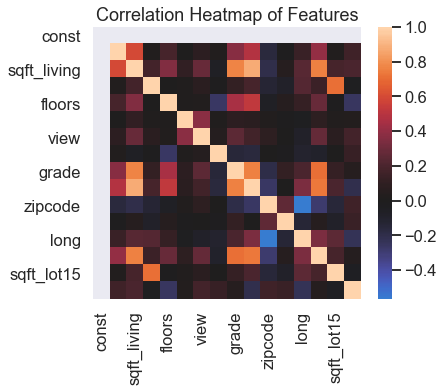

B-P het-sced Test p-value: 2.185771380635458e-229


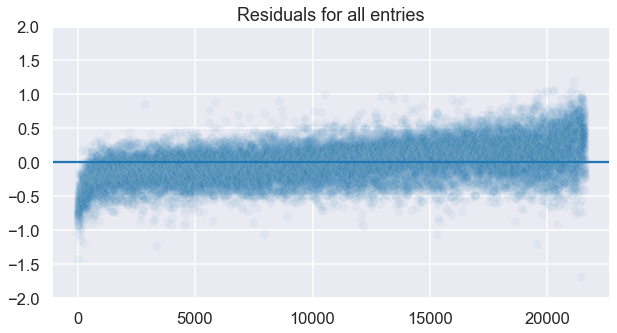

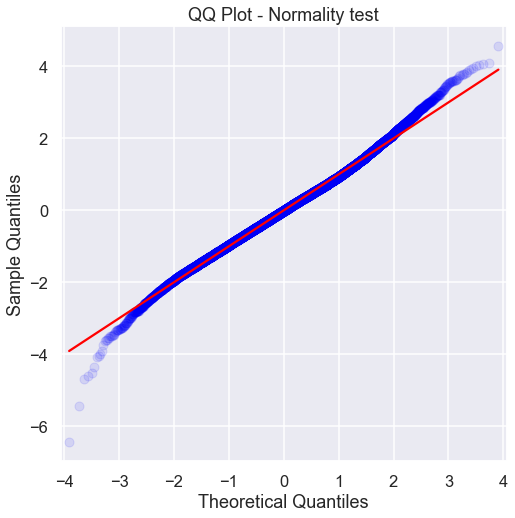

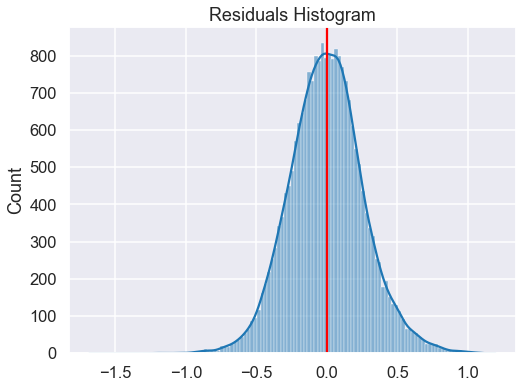

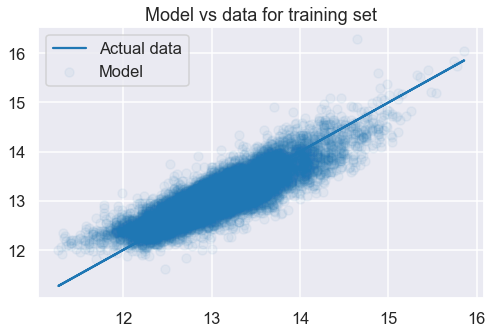

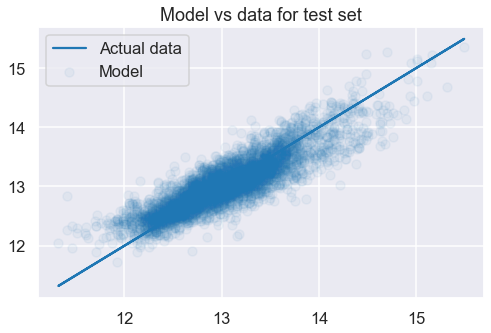

Train vs Test bias:
-4.559518139966972e-15 | -0.001225346555383359
Train vs Test variance:
0.20525205758431753 | 0.21554410683589253



In [44]:
model1b_log = check_model(X2, ylog)

In [45]:
# let's investigate if bedrooms/bathrooms can be combined into a single number?

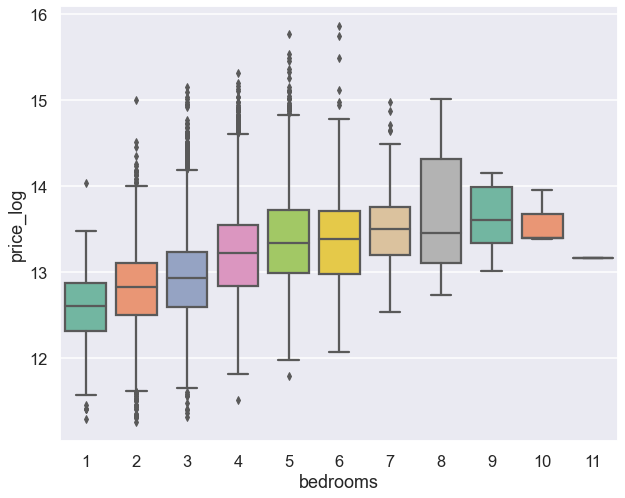

In [46]:
box_it('bedrooms', 'price_log', df2)

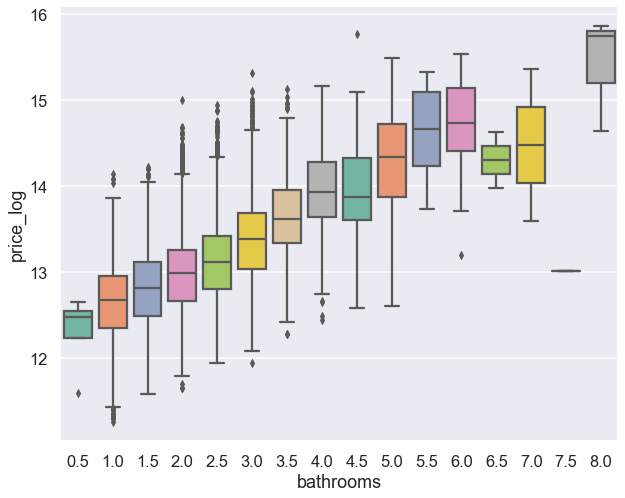

In [47]:
box_it('bathrooms', 'price_log', df2)

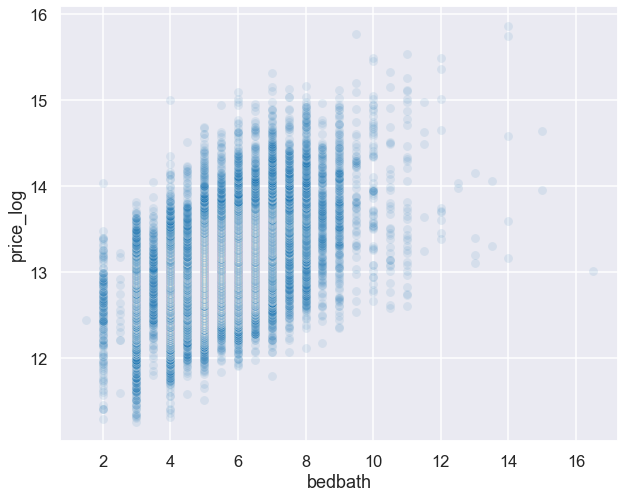

In [48]:
df3 = df1.copy()
df3['bedbath'] = df3['bathrooms'] + df3['bedrooms']
scatter_it('bedbath', 'price_log', df3)

In [49]:
# Because bathrooms/bedrooms seem to be correlated with sqft_living (among others)
# let's use 'bedbath' as a proxy

Cross-validation R-squared mean: 0.6742684545123281
Cross-validation RMSE mean: 209399.6643508929


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.676
Model:                            OLS   Adj. R-squared:                  0.676
Method:                 Least Squares   F-statistic:                     3007.
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        10:43:10   Log-Likelihood:            -2.9514e+05
No. Observations:               21592   AIC:                         5.903e+05
Df Residuals:                   21576   BIC:                         5.904e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -3.075e+07   2.86e+06    -10.762      0.000   -3.63e+07   -2.51e+07
sqft_living     177.0683      6.217     28.484      0.000     164.883     189.253
sqft_lot          0.2057      0.050      4.135      0.000       0.108       0.303
floors        -1.308e+04   3464.590     -3.775      0.000   -1.99e+04   -6288.255
waterfront     6.296e+05   1.88e+04     33.453      0.000    5.93e+05    6.66e+05
view           6.258e+04   2193.354     28.530      0.000    5.83e+04    6.69e+04
condition      4.999e+04   2305.187     21.685      0.000    4.55e+04    5.45e+04
grade          8.154e+04   2152.376     37.884      0.000    7.73e+04    8.58e+04
sqft_above       32.3874      6.830      4.742      0.000      19.000      45.774
zipcode        -434.5690     34.013    -12.777      0.000    -501.236    -367.902
lat             6.73e+05    1.1e+04     61.349      0.000    6.52e+05    6.95e+05
long          -3.335e+05   1.33e+04    -25.141      0.000    -3.6e+05   -3.08e+05
sqft_living15    21.4695      3.580      5.997      0.000      14.453      28.486
sqft_lot15       -0.4151      0.076     -5.449      0.000      -0.564      -0.266
bsmt           4686.8628   5238.491      0.895      0.371   -5580.967     1.5e+04
bedbath        -2.24e+04   1555.244    -14.402      0.000   -2.54e+04   -1.93e+04
==============================================================================
Omnibus:                    18154.600   Durbin-Watson:                   1.098
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1714273.091
Skew:                           3.522   Prob(JB):                         0.00
Kurtosis:                      46.079   Cond. No.                     2.02e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.02e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   const          21592 non-null  float64
 1   sqft_living    21592 non-null  int64  
 2   sqft_lot       21592 non-null  int64  
 3   floors         21592 non-null  float64
 4   waterfront     21592 non-null  float64
 5   view           21592 non-null  float64
 6   condition      21592 non-null  int64  
 7   grade          21592 non-null  int64  
 8   sqft_above     21592 non-null  int64  
 9   zipcode        21592 non-null  int64  
 10  lat            21592 non-null  float64
 11  long           21592 non-null  float64
 12  sqft_living15  21592 non-null  int64  
 13  sqft_lot15     21592 non-null  int64  
 14  bsmt           21592 non-null  int64  
 15  bedbath        21592 non-null  float64
dtypes: float64(7), int64(9)
memory usage: 3.4 MB


None

,const,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,zipcode,lat,long,sqft_living15,sqft_lot15,bsmt,bedbath
count,21592.0,21592.000000,2.159200e+04,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000
mean,1.0,2080.365228,1.510249e+04,1.494049,0.006762,0.233235,3.409828,7.657883,1788.634263,98077.948731,47.560081,-122.213962,1986.703825,12760.807568,0.385050,5.508059
std,0.0,918.177240,4.141692e+04,0.539616,0.081953,0.764753,0.650507,1.173081,827.816606,53.514628,0.138564,0.140730,685.253500,27277.086673,0.486618,1.459877
min,1.0,370.000000,5.720000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,0.000000,1.500000
25%,1.0,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,98033.000000,47.471075,-122.328000,1490.000000,5100.000000,0.000000,4.500000
50%,1.0,1910.000000,7.620000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,98065.000000,47.571800,-122.230500,1840.000000,7620.000000,0.000000,5.500000
75%,1.0,2550.000000,1.068725e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,1.000000,6.500000
max,1.0,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,1.000000,16.500000


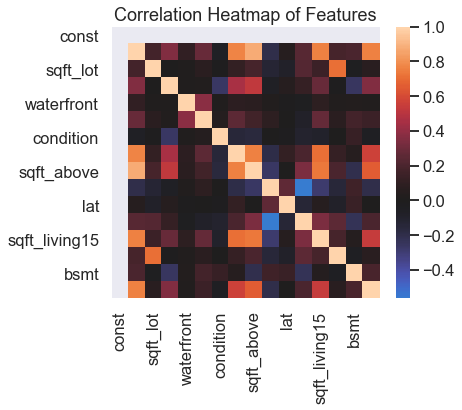

B-P het-sced Test p-value: 0.0


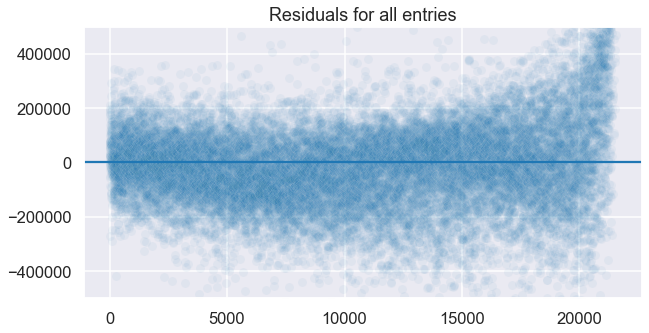

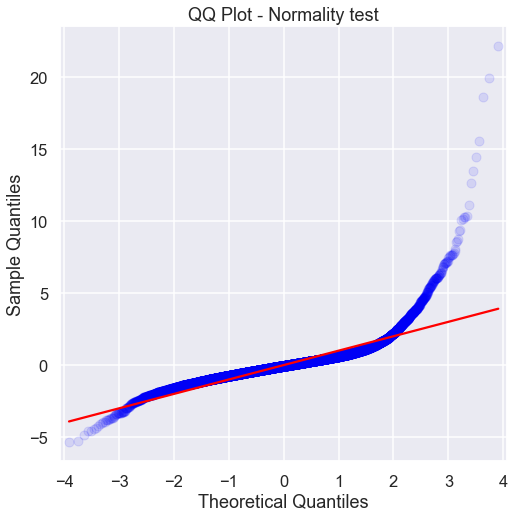

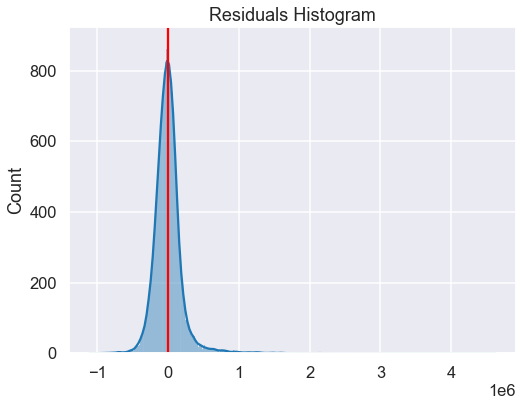

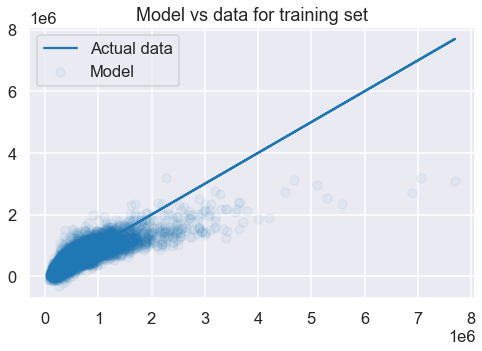

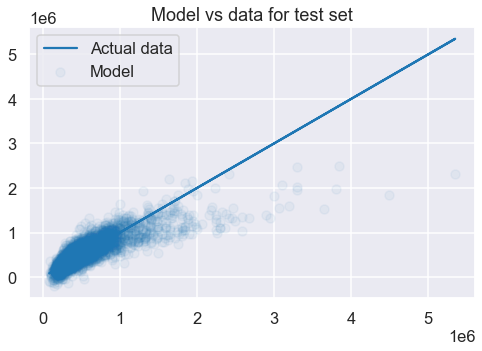

Train vs Test bias:
1.4793325545770833e-08 | -6643.85659344153
Train vs Test variance:
90615433399.33582 | 90944821312.24213



In [50]:
X2['bedbath'] = X['bathrooms'] + X['bedrooms']
X3 = X2.drop(['bedrooms'], axis=1)

model1c = check_model(X3, y)

Cross-validation R-squared mean: 0.6735905680015302
Cross-validation RMSE mean: 209613.18715287917


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.675
Method:                 Least Squares   F-statistic:                     3742.
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        10:43:13   Log-Likelihood:            -2.9517e+05
No. Observations:               21592   AIC:                         5.904e+05
Df Residuals:                   21579   BIC:                         5.905e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -2.873e+07   2.79e+06    -10.288      0.000   -3.42e+07   -2.33e+07
sqft_living   185.2068      4.383     42.252      0.000     176.615     193.799
sqft_lot        0.0104      0.036      0.288      0.773      -0.060       0.081
floors      -1.518e+04   3433.878     -4.422      0.000   -2.19e+04   -8452.661
waterfront   6.243e+05   1.88e+04     33.154      0.000    5.87e+05    6.61e+05
view         6.446e+04   2166.498     29.754      0.000    6.02e+04    6.87e+04
condition    4.941e+04   2305.076     21.434      0.000    4.49e+04    5.39e+04
grade        8.556e+04   2053.619     41.665      0.000    8.15e+04    8.96e+04
sqft_above     31.2787      4.444      7.039      0.000      22.568      39.989
zipcode      -452.1093     33.878    -13.345      0.000    -518.513    -385.706
lat          6.785e+05    1.1e+04     61.927      0.000    6.57e+05       7e+05
long         -3.29e+05    1.3e+04    -25.238      0.000   -3.55e+05   -3.03e+05
bedbath     -2.215e+04   1550.678    -14.287      0.000   -2.52e+04   -1.91e+04
==============================================================================
Omnibus:                    17919.379   Durbin-Watson:                   1.104
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1608282.960
Skew:                           3.464   Prob(JB):                         0.00
Kurtosis:                      44.709   Cond. No.                     1.95e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.95e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   const        21592 non-null  float64
 1   sqft_living  21592 non-null  int64  
 2   sqft_lot     21592 non-null  int64  
 3   floors       21592 non-null  float64
 4   waterfront   21592 non-null  float64
 5   view         21592 non-null  float64
 6   condition    21592 non-null  int64  
 7   grade        21592 non-null  int64  
 8   sqft_above   21592 non-null  int64  
 9   zipcode      21592 non-null  int64  
 10  lat          21592 non-null  float64
 11  long         21592 non-null  float64
 12  bedbath      21592 non-null  float64
dtypes: float64(7), int64(6)
memory usage: 2.9 MB


None

,const,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,zipcode,lat,long,bedbath
count,21592.0,21592.000000,2.159200e+04,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000
mean,1.0,2080.365228,1.510249e+04,1.494049,0.006762,0.233235,3.409828,7.657883,1788.634263,98077.948731,47.560081,-122.213962,5.508059
std,0.0,918.177240,4.141692e+04,0.539616,0.081953,0.764753,0.650507,1.173081,827.816606,53.514628,0.138564,0.140730,1.459877
min,1.0,370.000000,5.720000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,98001.000000,47.155900,-122.519000,1.500000
25%,1.0,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,98033.000000,47.471075,-122.328000,4.500000
50%,1.0,1910.000000,7.620000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,98065.000000,47.571800,-122.230500,5.500000
75%,1.0,2550.000000,1.068725e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,98118.000000,47.678000,-122.125000,6.500000
max,1.0,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,98199.000000,47.777600,-121.315000,16.500000


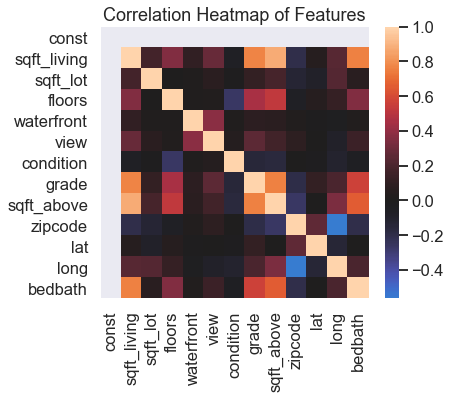

B-P het-sced Test p-value: 0.0


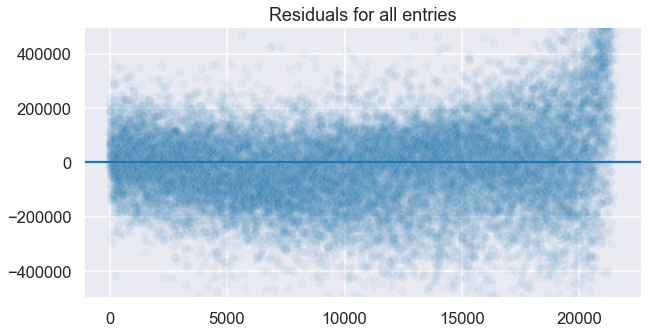

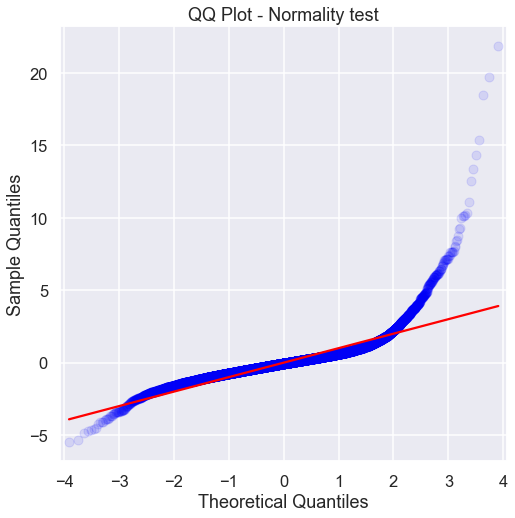

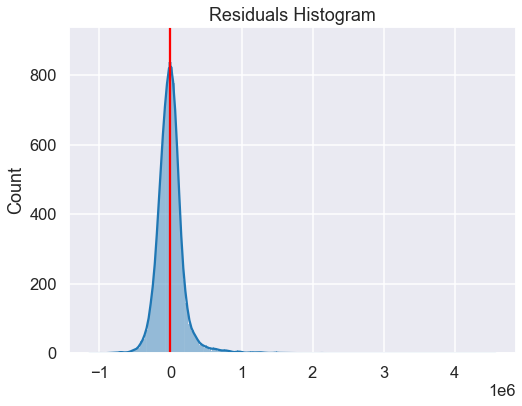

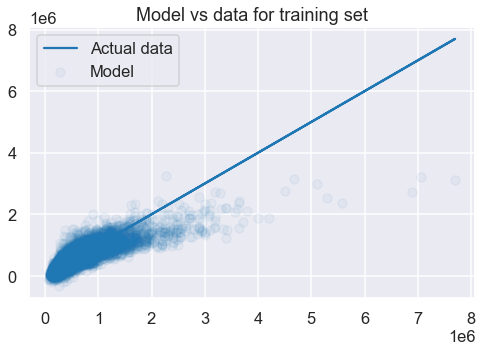

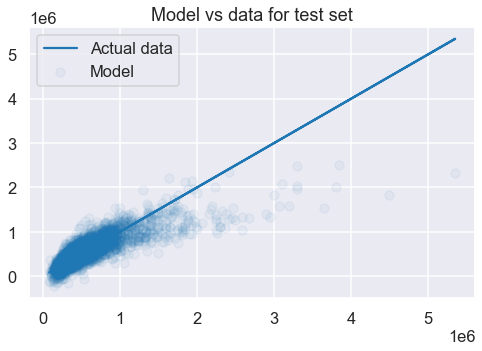

Train vs Test bias:
7.912548513284937e-09 | -6909.503111711526
Train vs Test variance:
90490178447.8421 | 90606952904.62909



In [51]:
# sqft_living15/sqft_lot15 seem to be over-correlated, and bsmt has a high p-value
X4 = X3.drop(['sqft_living15', 'sqft_lot15', 'bsmt'], axis=1)
model1d = check_model(X4, y)

Cross-validation R-squared mean: 0.6474855473138457
Cross-validation RMSE mean: 217904.89342806092


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.649
Model:                            OLS   Adj. R-squared:                  0.648
Method:                 Least Squares   F-statistic:                     3621.
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        10:43:17   Log-Likelihood:            -2.9603e+05
No. Observations:               21592   AIC:                         5.921e+05
Df Residuals:                   21580   BIC:                         5.922e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -4.116e+07   2.89e+06    -14.246      0.000   -4.68e+07   -3.55e+07
sqft_lot       0.1031      0.037      2.748      0.006       0.030       0.177
floors     -6.363e+04   3367.895    -18.895      0.000   -7.02e+04    -5.7e+04
waterfront  6.318e+05   1.96e+04     32.244      0.000    5.93e+05     6.7e+05
view        8.335e+04   2205.771     37.787      0.000     7.9e+04    8.77e+04
condition   5.785e+04   2389.439     24.212      0.000    5.32e+04    6.25e+04
grade       1.106e+05   2045.883     54.064      0.000    1.07e+05    1.15e+05
sqft_above   161.7080      3.326     48.615      0.000     155.188     168.228
zipcode     -396.2174     35.224    -11.249      0.000    -465.259    -327.176
lat         7.179e+05   1.14e+04     63.200      0.000    6.96e+05     7.4e+05
long       -3.689e+05   1.35e+04    -27.275      0.000   -3.95e+05   -3.42e+05
bedbath     1.232e+04   1372.160      8.975      0.000    9626.102     1.5e+04
==============================================================================
Omnibus:                    19144.106   Durbin-Watson:                   1.048
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          2126555.342
Skew:                           3.796   Prob(JB):                         0.00
Kurtosis:                      51.022   Cond. No.                     1.94e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.94e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   const       21592 non-null  float64
 1   sqft_lot    21592 non-null  int64  
 2   floors      21592 non-null  float64
 3   waterfront  21592 non-null  float64
 4   view        21592 non-null  float64
 5   condition   21592 non-null  int64  
 6   grade       21592 non-null  int64  
 7   sqft_above  21592 non-null  int64  
 8   zipcode     21592 non-null  int64  
 9   lat         21592 non-null  float64
 10  long        21592 non-null  float64
 11  bedbath     21592 non-null  float64
dtypes: float64(7), int64(5)
memory usage: 2.8 MB


None

,const,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,zipcode,lat,long,bedbath
count,21592.0,2.159200e+04,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000
mean,1.0,1.510249e+04,1.494049,0.006762,0.233235,3.409828,7.657883,1788.634263,98077.948731,47.560081,-122.213962,5.508059
std,0.0,4.141692e+04,0.539616,0.081953,0.764753,0.650507,1.173081,827.816606,53.514628,0.138564,0.140730,1.459877
min,1.0,5.720000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,98001.000000,47.155900,-122.519000,1.500000
25%,1.0,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,98033.000000,47.471075,-122.328000,4.500000
50%,1.0,7.620000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,98065.000000,47.571800,-122.230500,5.500000
75%,1.0,1.068725e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,98118.000000,47.678000,-122.125000,6.500000
max,1.0,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,98199.000000,47.777600,-121.315000,16.500000


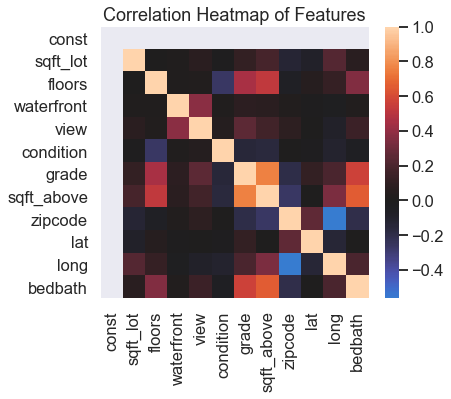

B-P het-sced Test p-value: 0.0


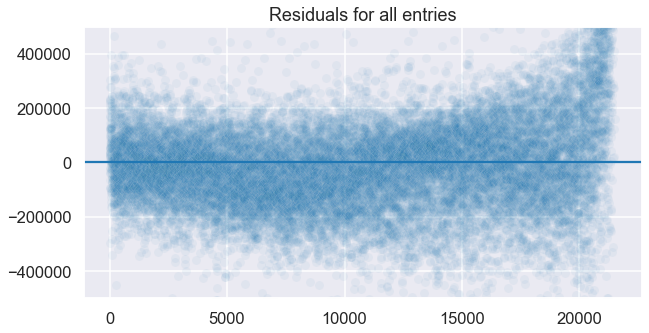

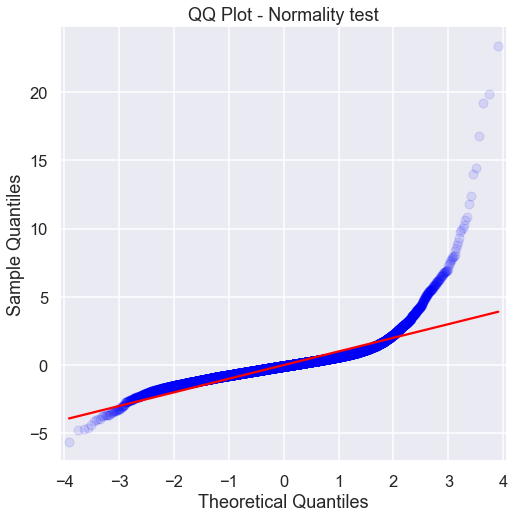

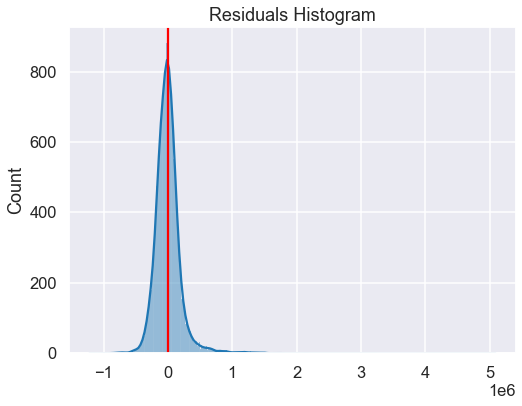

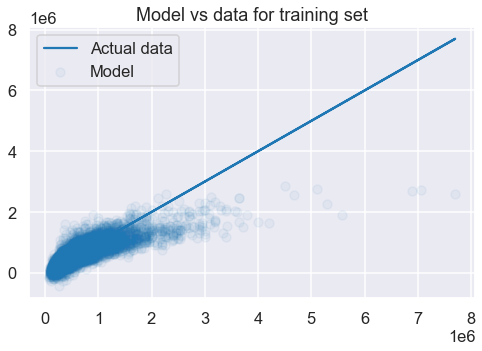

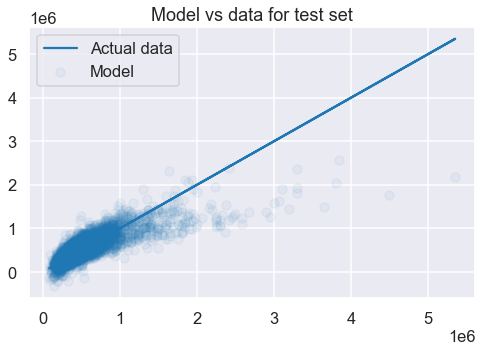

Train vs Test bias:
-9.269552308683672e-10 | -4429.058184222629
Train vs Test variance:
86776869406.32465 | 87766861123.9303



In [52]:
# And finally, 'sqft_living' since it highly correlates with bedbath and grade
X5 = X4.drop(['sqft_living'], axis=1)
model1e = check_model(X5, y)

Cross-validation R-squared mean: 0.7276325492193042
Cross-validation RMSE mean: 0.2747119312043905


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.728
Model:                            OLS   Adj. R-squared:                  0.728
Method:                 Least Squares   F-statistic:                     5257.
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        10:43:20   Log-Likelihood:                -2723.2
No. Observations:               21592   AIC:                             5470.
Df Residuals:                   21580   BIC:                             5566.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -55.5496      3.642    -15.252      0.000     -62.688     -48.411
sqft_lot        5e-07   4.73e-08     10.578      0.000    4.07e-07    5.93e-07
floors        -0.0222      0.004     -5.238      0.000      -0.031      -0.014
waterfront     0.3815      0.025     15.448      0.000       0.333       0.430
view           0.1050      0.003     37.757      0.000       0.100       0.110
condition      0.1008      0.003     33.484      0.000       0.095       0.107
grade          0.1834      0.003     71.134      0.000       0.178       0.188
sqft_above     0.0001   4.19e-06     35.303      0.000       0.000       0.000
zipcode       -0.0005   4.44e-05    -10.508      0.000      -0.001      -0.000
lat            1.5566      0.014    108.721      0.000       1.529       1.585
long          -0.3117      0.017    -18.281      0.000      -0.345      -0.278
bedbath        0.0394      0.002     22.773      0.000       0.036       0.043
==============================================================================
Omnibus:                      309.826   Durbin-Watson:                   1.413
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              450.975
Skew:                           0.170   Prob(JB):                     1.18e-98
Kurtosis:                       3.621   Cond. No.                     1.94e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.94e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   const       21592 non-null  float64
 1   sqft_lot    21592 non-null  int64  
 2   floors      21592 non-null  float64
 3   waterfront  21592 non-null  float64
 4   view        21592 non-null  float64
 5   condition   21592 non-null  int64  
 6   grade       21592 non-null  int64  
 7   sqft_above  21592 non-null  int64  
 8   zipcode     21592 non-null  int64  
 9   lat         21592 non-null  float64
 10  long        21592 non-null  float64
 11  bedbath     21592 non-null  float64
dtypes: float64(7), int64(5)
memory usage: 2.8 MB


None

,const,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,zipcode,lat,long,bedbath
count,21592.0,2.159200e+04,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000
mean,1.0,1.510249e+04,1.494049,0.006762,0.233235,3.409828,7.657883,1788.634263,98077.948731,47.560081,-122.213962,5.508059
std,0.0,4.141692e+04,0.539616,0.081953,0.764753,0.650507,1.173081,827.816606,53.514628,0.138564,0.140730,1.459877
min,1.0,5.720000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,98001.000000,47.155900,-122.519000,1.500000
25%,1.0,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,98033.000000,47.471075,-122.328000,4.500000
50%,1.0,7.620000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,98065.000000,47.571800,-122.230500,5.500000
75%,1.0,1.068725e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,98118.000000,47.678000,-122.125000,6.500000
max,1.0,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,98199.000000,47.777600,-121.315000,16.500000


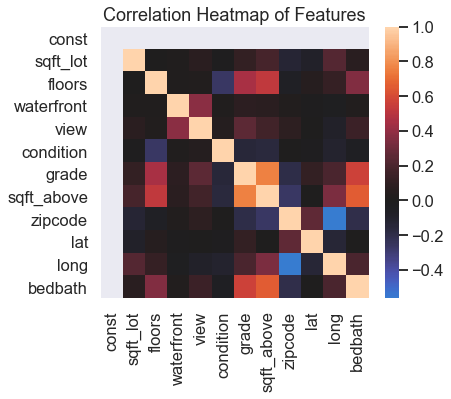

B-P het-sced Test p-value: 1.007893194911936e-196


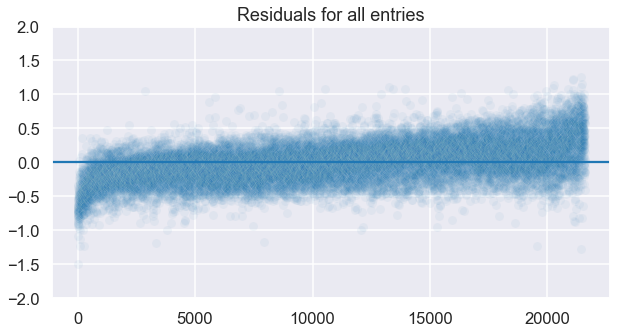

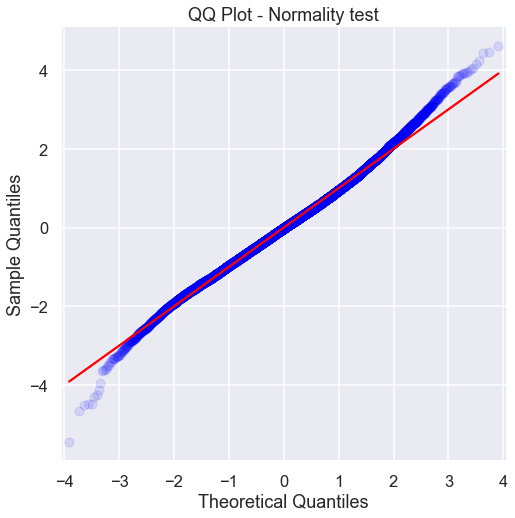

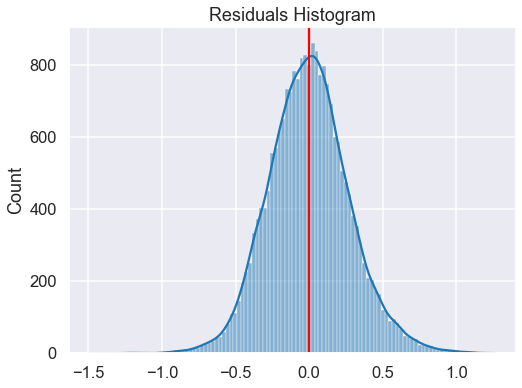

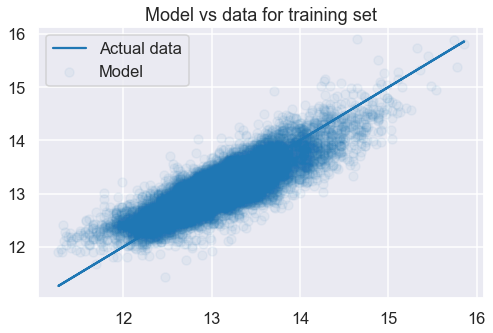

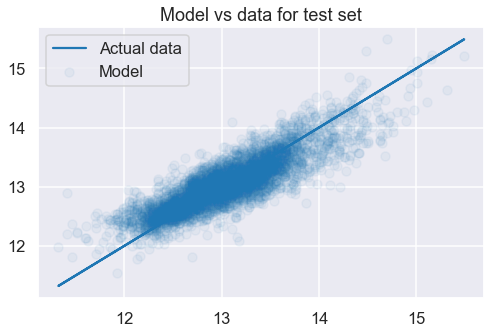

Train vs Test bias:
7.105221677425074e-16 | 0.001555423553508629
Train vs Test variance:
0.19877835579276848 | 0.20800369458626733



In [53]:
# And let's check it against using the ylog target:
model1e_log = check_model(X5, ylog)

* Alright! We have a model with lots of features, with a reasonable R-squared (0.649 / 0.728), and low multi-collinearity.
* The residuals seem to be fairly normal.
* And although the B-P test for heteroscedasticity suggests problems, the visual plot looks decent, especially for the vast majority of residuals.


* With that model as a baseline, let's try and do a ground-up model, and do some feature-engineering.

In [54]:
# What features most highly correlate with price?
datacorr = df1.corr()
datacorr[datacorr['price_log'] > .3].iloc[:,-1]

price            0.891730
bedrooms         0.351063
bathrooms        0.543811
sqft_living      0.695235
floors           0.310495
view             0.344737
grade            0.703736
sqft_above       0.601646
sqft_basement    0.313106
lat              0.448816
sqft_living15    0.619441
price_log        1.000000
Name: price_log, dtype: float64

Cross-validation R-squared mean: 0.607947768048266
Cross-validation RMSE mean: 229826.08072969582


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.608
Model:                            OLS   Adj. R-squared:                  0.608
Method:                 Least Squares   F-statistic:                 1.673e+04
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        10:43:23   Log-Likelihood:            -2.9721e+05
No. Observations:               21592   AIC:                         5.944e+05
Df Residuals:                   21589   BIC:                         5.945e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        1.562e+05   4622.204     33.794      0.000    1.47e+05    1.65e+05
sqft_living   265.4050      1.716    154.636      0.000     262.041     268.769
dt_lat      -1.436e+06    1.8e+04    -79.602      0.000   -1.47e+06    -1.4e+06
==============================================================================
Omnibus:                    18446.405   Durbin-Watson:                   0.911
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1336264.375
Skew:                           3.718   Prob(JB):                         0.00
Kurtosis:                      40.815   Cond. No.                     2.65e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.65e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   const        21592 non-null  float64
 1   sqft_living  21592 non-null  int64  
 2   dt_lat       21592 non-null  float64
dtypes: float64(2), int64(1)
memory usage: 1.3 MB


None

,const,sqft_living,dt_lat
count,21592.0,21592.000000,21592.000000
mean,1.0,2080.365228,0.117010
std,0.0,918.177240,0.087329
min,1.0,370.000000,0.000005
25%,1.0,1430.000000,0.053005
50%,1.0,1910.000000,0.093395
75%,1.0,2550.000000,0.156805
max,1.0,13540.000000,0.450205


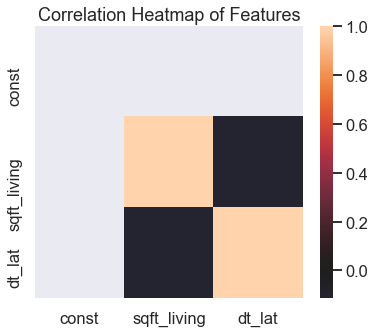

B-P het-sced Test p-value: 0.0


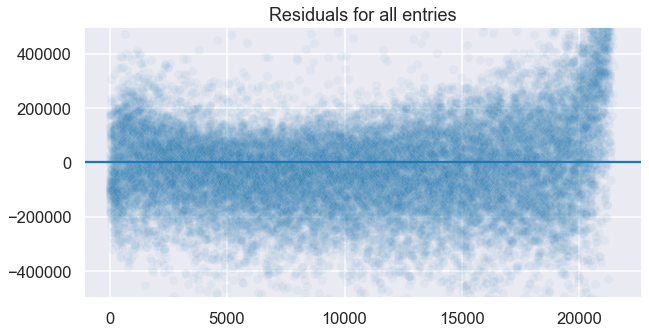

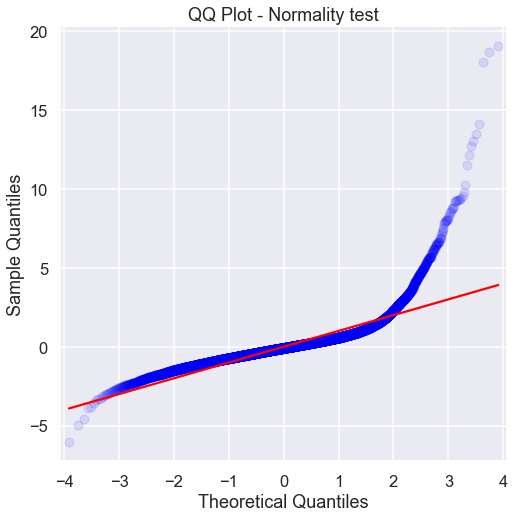

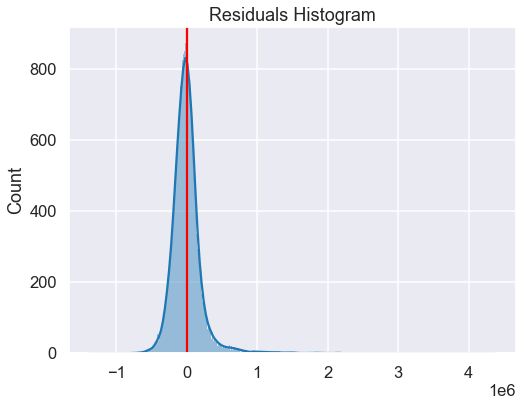

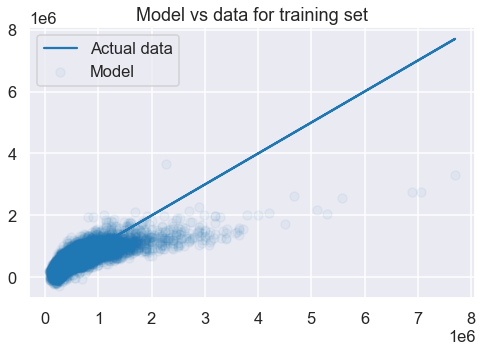

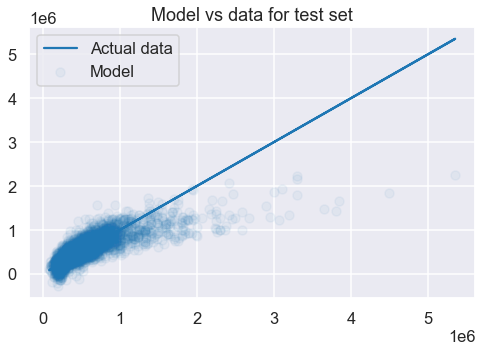

Train vs Test bias:
1.7554969534106243e-10 | -5497.087339377308
Train vs Test variance:
80935714508.99304 | 84239692314.26654



In [55]:
X6 = X2.copy()

# Besides high-correlation features like sqft_living and grade,
# I'd like to incorporate location data
# Let's try using the 'lat' feature to determine distance from downtown,
# using the lat/long of the center of downtown Seattle
downtown = [47.606105, -122.332913]
X6['dt_lat'] = abs(abs(X6['lat']) - abs(downtown[0]))
model2a = check_model(X6[['sqft_living', 'dt_lat']], y)

In [56]:
# So we get a much simpler model, with just sqft and how far (north/south) from downtown,
# that has a pretty decent R-squared of 0.608

In [57]:
# Since zipcode seemed to do something in the naive model above, as odd as the values are,
# let's try encoding a proportional median house price in each zip code.

In [278]:
zip_medians = {}
for z in df2['zipcode'].unique():
    zip_medians[z] = df2[df2['zipcode'] == z].price.median()
max_median = max(zip_medians.values())
zip_ranks = {}
for z in df2['zipcode'].unique():
    zip_ranks[z] = zip_medians[z] / max_median

In [279]:
# Let's investigate this data:

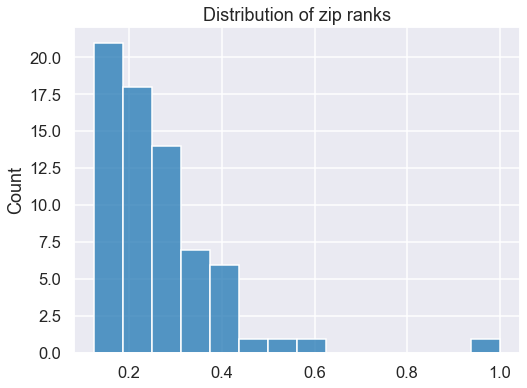

In [280]:
plt.figure(figsize=(8,6))
sns.histplot(x=zip_ranks.values())
plt.title('Distribution of zip ranks');

In [281]:
# What are the highest-ranked zipcodes?
zip_data = {'zipcode':[], 'median':[], 'rank':[]}
for z in zip_ranks.keys():
    if zip_ranks[z] > .4:
        zip_data['zipcode'].append(z)
        zip_data['median'].append(zip_medians[z])
        zip_data['rank'].append(zip_ranks[z])
zip_df = pd.DataFrame(zip_data)
zip_df.sort_values(by='rank', inplace=True)

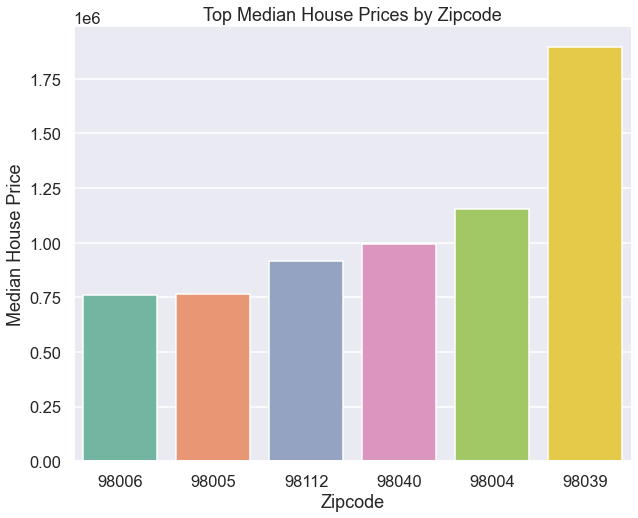

In [282]:
fig = plt.figure(figsize=(10,8))
ax = fig.gca()
sns.barplot(x=[0,1,2,3,4,5], y=zip_df['median'], palette='Set2')
plt.title('Top Median House Prices by Zipcode')
ax.set_xticklabels(zip_df['zipcode'])
plt.xlabel('Zipcode')
plt.ylabel('Median House Price');

In [63]:
# Where are they?
# Marker A is zipcode 98039, the highest rank. It appears to be a country club/waterfront type of area
# Besides the other marked zipcodes, 98006 and 98040 are the pink and brown areas in the lower left

# image from: https://zipmap.net/Washington/King_County.htm

![image](images/seattlezip.png)

In [64]:
# Before incorporating this into the model, I need to prevent data leakage (using zip_rank data from
# the entire dataset to model only the training set) I'll create an alternate version of the 
# check_model function to deal with this.

In [237]:
def check_model_zip(Xs, ys):
    """
    Shortcut function for running a battery of linear regression models and tests,
    while also incorporating the zip_rank engineered feature.
    
    2 Arguments:
    
    Xs: dataframe of independent variables' values
    ys: series/array of dependent variable values
    
    Displays results and plots of several modeling/testing components:
    
    - Linear regression - 5-fold cross validation
        - With mean r-squared value
    - Linear regression - Statsmodels WLS summary
    - .info(), .describe(), and seaborn heatmap of Xs statistics
    - Breusch-pagan test for heterscedasticity of residuals
    - Plot of model vs. actual y-values, for visual inspection of het-sced.
    - QQ plot
    - Histogram of residuals
    - Random training/testing split
        - plots of training and testing y-values vs predicted
        - Bias and variance values
    """
    Xs = sm.add_constant(Xs)
    X_train, X_test, y_train, y_test = train_test_split(Xs, ys, test_size=.2, random_state=666)
    
    # 5-fold cross-validation
    linreg = LinearRegression()
    x_shuffle = Xs.sample(frac=1, random_state=666)
    y_shuffle = ys.sample(frac=1, random_state=666)
    mean_r2 = np.mean(cross_val_score(linreg, x_shuffle, y_shuffle, cv=5,  scoring='r2'))
    mean_rmse = -np.mean(cross_val_score(linreg, x_shuffle, y_shuffle, cv=5,  scoring='neg_mean_squared_error'))
    print(f'Cross-validation R-squared mean: {mean_r2}')
    print(f'Cross-validation MSE mean: {mean_rmse}')
    
    # Display statsmodels summary
    print("OLS Model Summary for Training Set:")
    linreg = LinearRegression()
    model = sm.OLS(y_train,X_train).fit()
    display(model.summary())
    
    # Display X values .info(), .describe(), and heatmap
    display(Xs.info())
    display(Xs.describe())
    
    # Heatmap for multicollinearity check
    
    plt.figure(figsize=(6,5))
    plt.title('Correlation Heatmap of Features')
    sns.heatmap(Xs.corr(), center=0)
    plt.show();
    
    # Breusch-pagan Test for heterscedasticity
    print("B-P het-sced Test p-value:", het_breuschpagan(model.resid, model.model.exog)[1])
    
    # Visual heteroscedasticity plot
    fig = plt.figure(figsize=(10,5))
    sns.scatterplot(x=np.arange(len(Xs)), y=(model.predict(Xs) - ys), alpha=.05)
    plt.axhline(0)
    if ys.max() > 100000:
        plt.ylim(-500000,500000)
    elif ys.max() < 20:
        plt.ylim(-2,2)
    plt.title('Residuals for X_train entries')
    plt.show();

    # QQ plot
    fig = plt.figure(figsize=(8,8))
    ax = fig.gca()
    sm.graphics.qqplot(model.resid, dist=stats.norm, line='s', fit=True, ax=ax, alpha=.1)
    plt.title('QQ Plot - Normality test')
    plt.show();

    # Residuals histogram
    fig = plt.figure(figsize=(8,6))
    sns.histplot(model.resid, kde=True)
    plt.axvline(model.resid.mean(), color='r')
    plt.title('Residuals Histogram')
    plt.show();

    # Find predictions based on train-test split
    linreg = LinearRegression()
    linreg.fit(X_train, y_train)
    
    lm_train_predictions = linreg.predict(X_train)
    lm_test_predictions = linreg.predict(X_test)

    # Plot of model vs training set
    plt.figure(figsize=(8, 5))
    plt.scatter(y_train, lm_train_predictions, label='Model', alpha=.05)
    plt.plot(y_train, y_train, label='Actual data')
    plt.title('Model vs data for training set')
    plt.legend()
    plt.show()

    # Plot of model vs test set
    plt.figure(figsize=(8, 5))
    plt.scatter(y_test, lm_test_predictions, label='Model', alpha=.05)
    plt.plot(y_test, y_test, label='Actual data')
    plt.title('Model vs data for test set')
    plt.legend()
    plt.show()

    # Bias and variance for train vs test sets
    b1 = bias(y_train, lm_train_predictions)
    v1 = variance(lm_train_predictions)
    
    b2 = bias(y_test, lm_test_predictions) 
    v2 = variance(lm_test_predictions) 
    print(f'Train vs Test bias:\n{b1} | {b2}')
    print(f'Train vs Test variance:\n{v1} | {v2}\n')
    
    return model

In [301]:
# Run zip-rank mapping on a split dataset to obtain ranks for each zipcode
# (with same random seed as function above)
X_tr, X_te, y_tr, y_te = train_test_split(Xs, ylog, test_size=.2, random_state=666)

# Create zip_rank data, create zip_rank column for train and test sets (both based on training data)
Xy_train = pd.concat([X_tr, y_tr], axis=1).copy()
zip_means = {}

for z in Xy_train['zipcode'].unique():
    zip_means[z] = Xy_train[Xy_train['zipcode'] == z].price_log.mean()
max_mean = max(zip_means.values())

zip_ranks = {}
for z in Xy_train['zipcode'].unique():
    zip_ranks[z] = zip_means[z] / max_mean
# X_train['zip_rank'] = Xy_train.zipcode.map(zip_ranks)
# X_test['zip_rank'] = Xy_test.zipcode.map(zip_ranks)
# X_train.drop('zipcode', axis=1, inplace=True)
# X_test.drop('zipcode', axis=1, inplace=True)

Cross-validation R-squared mean: 0.6770645324135414
Cross-validation MSE mean: 43690815026.95506
OLS Model Summary for Training Set:


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.670
Model:                            OLS   Adj. R-squared:                  0.670
Method:                 Least Squares   F-statistic:                 1.171e+04
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        14:25:12   Log-Likelihood:            -2.3620e+05
No. Observations:               17273   AIC:                         4.724e+05
Df Residuals:                   17269   BIC:                         4.724e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -4.863e+06   8.49e+04    -57.277      0.000   -5.03e+06    -4.7e+06
sqft_living   233.6227      1.834    127.402      0.000     230.028     237.217
zip_rank       5.5e+06   9.29e+04     59.193      0.000    5.32e+06    5.68e+06
dt_lat      -2.739e+05   2.68e+04    -10.211      0.000   -3.27e+05   -2.21e+05
==============================================================================
Omnibus:                    17530.800   Durbin-Watson:                   2.016
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          2436811.469
Skew:                           4.720   Prob(JB):                         0.00
Kurtosis:                      60.417   Cond. No.                     1.81e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.81e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   const        21592 non-null  float64
 1   sqft_living  21592 non-null  int64  
 2   zip_rank     21592 non-null  float64
 3   dt_lat       21592 non-null  float64
dtypes: float64(3), int64(1)
memory usage: 1.4 MB


None

,const,sqft_living,zip_rank,dt_lat
count,21592.0,21592.000000,21592.000000,21592.000000
mean,1.0,2080.365228,0.899738,0.117010
std,0.0,918.177240,0.026199,0.087329
min,1.0,370.000000,0.850001,0.000005
25%,1.0,1430.000000,0.878122,0.053005
50%,1.0,1910.000000,0.901238,0.093395
75%,1.0,2550.000000,0.916408,0.156805
max,1.0,13540.000000,1.000000,0.450205


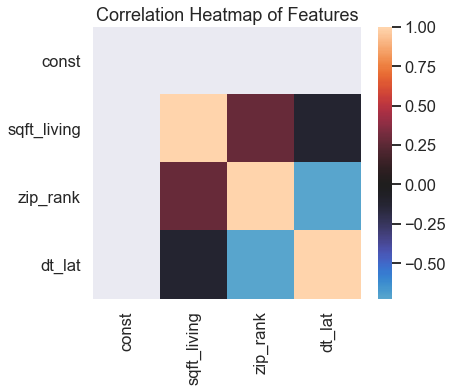

B-P het-sced Test p-value: 0.0


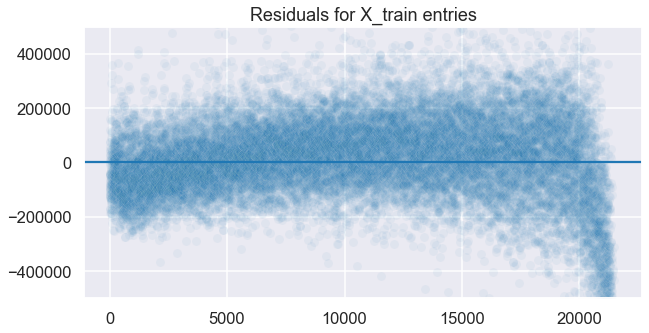

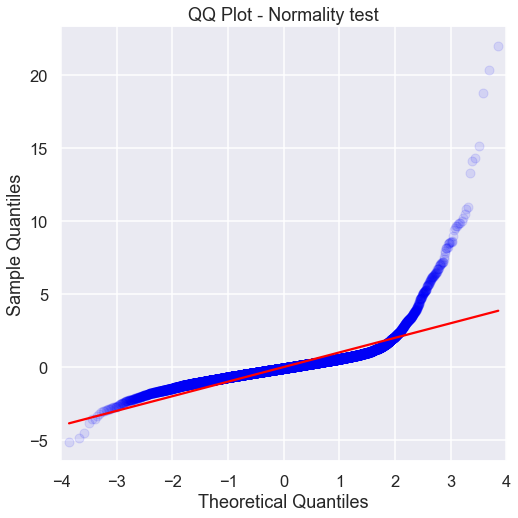

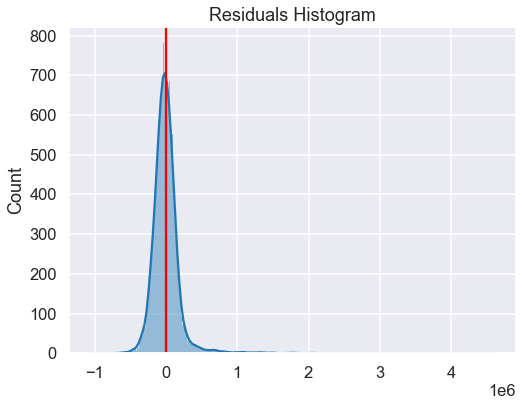

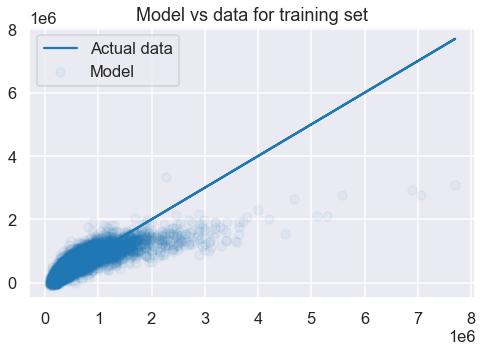

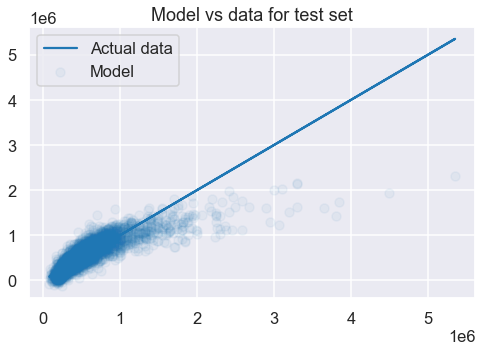

Train vs Test bias:
6.321325690263342e-10 | -2541.704151749938
Train vs Test variance:
89900602043.34808 | 95998461002.11816



In [303]:
X7 = X6.copy()
X7['zip_rank'] = X6.zipcode.map(zip_ranks)
X8 = X7[['sqft_living', 'zip_rank', 'dt_lat']].copy()
model2b = check_model_zip(X8, y)

Cross-validation R-squared mean: 0.6752780531443439
Cross-validation MSE mean: 43929382288.51953
OLS Model Summary for Training Set:


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.668
Model:                            OLS   Adj. R-squared:                  0.668
Method:                 Least Squares   F-statistic:                 1.741e+04
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        14:25:15   Log-Likelihood:            -2.3626e+05
No. Observations:               17273   AIC:                         4.725e+05
Df Residuals:                   17270   BIC:                         4.725e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -5.509e+06   5.67e+04    -97.102      0.000   -5.62e+06    -5.4e+06
sqft_living   231.0072      1.821    126.844      0.000     227.437     234.577
zip_rank     6.189e+06   6.41e+04     96.591      0.000    6.06e+06    6.31e+06
==============================================================================
Omnibus:                    17474.320   Durbin-Watson:                   2.019
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          2396235.343
Skew:                           4.698   Prob(JB):                         0.00
Kurtosis:                      59.931   Cond. No.                     1.21e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.21e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   const        21592 non-null  float64
 1   sqft_living  21592 non-null  int64  
 2   zip_rank     21592 non-null  float64
dtypes: float64(2), int64(1)
memory usage: 1.3 MB


None

,const,sqft_living,zip_rank
count,21592.0,21592.000000,21592.000000
mean,1.0,2080.365228,0.899738
std,0.0,918.177240,0.026199
min,1.0,370.000000,0.850001
25%,1.0,1430.000000,0.878122
50%,1.0,1910.000000,0.901238
75%,1.0,2550.000000,0.916408
max,1.0,13540.000000,1.000000


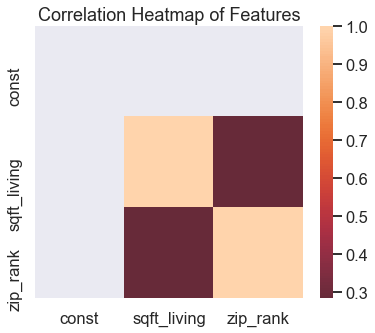

B-P het-sced Test p-value: 0.0


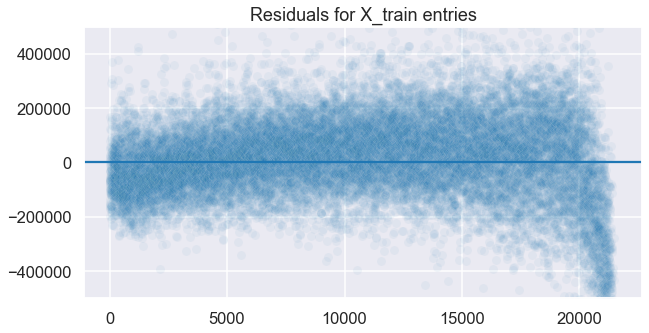

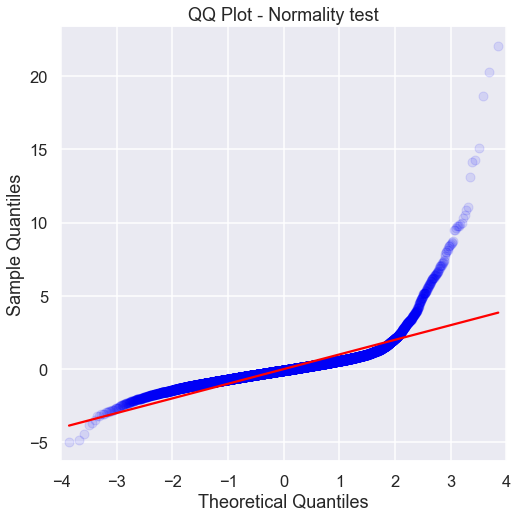

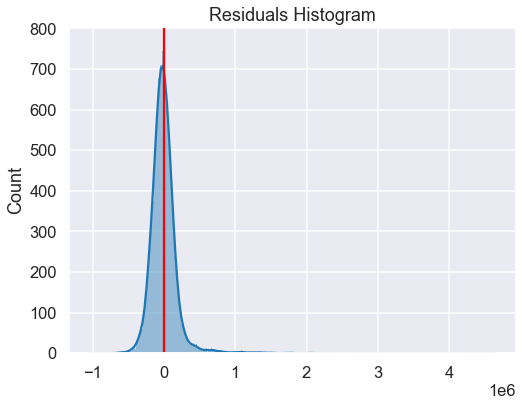

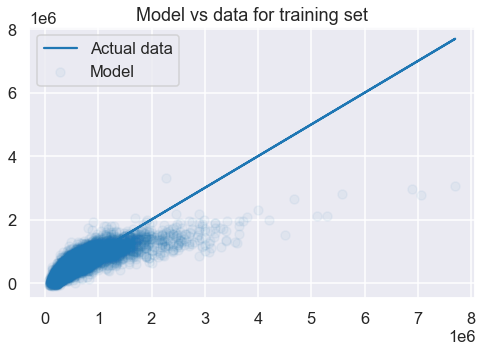

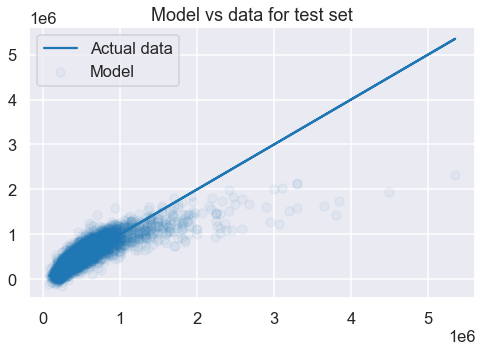

Train vs Test bias:
-2.269940392017116e-11 | -2243.281737104731
Train vs Test variance:
89633830164.83514 | 95858664058.9654



In [304]:
# dt_lat highly correlates with zip_rank, let's drop dt_lat and see:
X9 = X8.drop('dt_lat', axis=1)
model2b_alt = check_model_zip(X9, y)

Cross-validation R-squared mean: 0.7884046763390298
Cross-validation MSE mean: 0.058609009926642176
OLS Model Summary for Training Set:


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.785
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                 3.144e+04
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        14:25:18   Log-Likelihood:                -57.317
No. Observations:               17273   AIC:                             120.6
Df Residuals:                   17270   BIC:                             143.9
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           2.0226      0.065     30.958      0.000       1.895       2.151
sqft_living     0.0003    2.1e-06    145.132      0.000       0.000       0.000
zip_rank       11.5517      0.074    156.564      0.000      11.407      11.696
==============================================================================
Omnibus:                     1268.824   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5038.801
Skew:                           0.278   Prob(JB):                         0.00
Kurtosis:                       5.587   Cond. No.                     1.21e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.21e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   const        21592 non-null  float64
 1   sqft_living  21592 non-null  int64  
 2   zip_rank     21592 non-null  float64
dtypes: float64(2), int64(1)
memory usage: 1.3 MB


None

,const,sqft_living,zip_rank
count,21592.0,21592.000000,21592.000000
mean,1.0,2080.365228,0.899738
std,0.0,918.177240,0.026199
min,1.0,370.000000,0.850001
25%,1.0,1430.000000,0.878122
50%,1.0,1910.000000,0.901238
75%,1.0,2550.000000,0.916408
max,1.0,13540.000000,1.000000


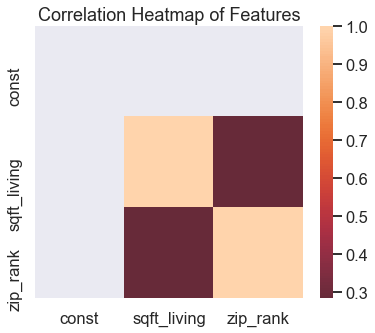

B-P het-sced Test p-value: 2.217188470678538e-52


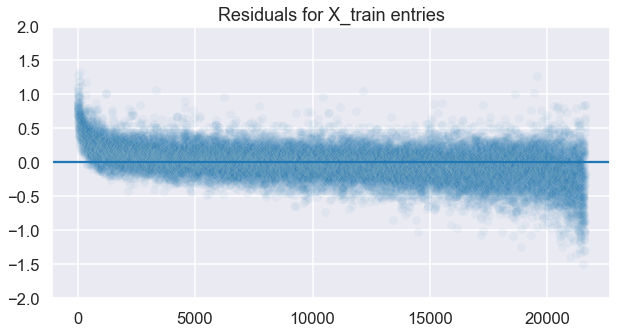

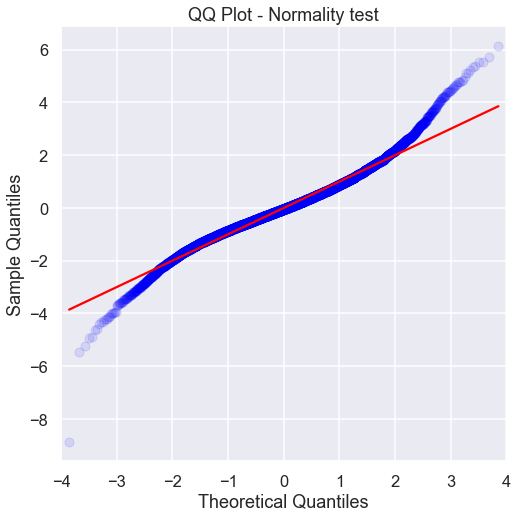

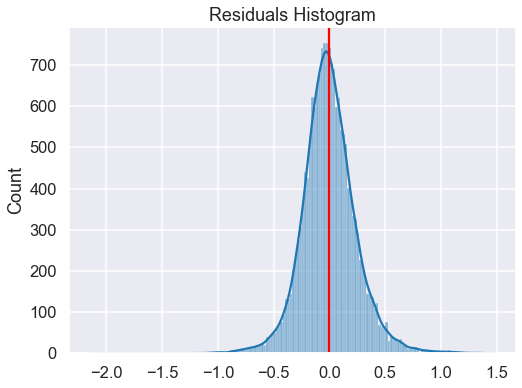

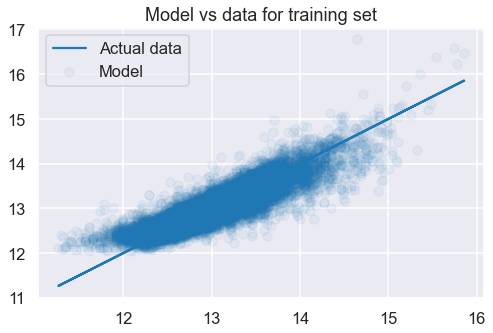

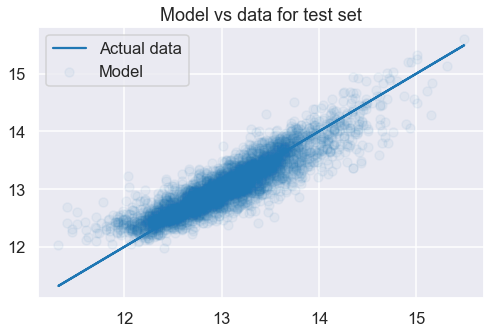

Train vs Test bias:
6.639356078948658e-16 | 0.005914619020721351
Train vs Test variance:
0.21462403892729753 | 0.23086482961667798



In [305]:
model2b_alt_log = check_model_zip(X9, ylog)

Cross-validation R-squared mean: 0.777651171708021
Cross-validation MSE mean: 30093841511.03431
OLS Model Summary for Training Set:


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.793
Model:                            OLS   Adj. R-squared:                  0.792
Method:                 Least Squares   F-statistic:                     1606.
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        14:25:21   Log-Likelihood:            -2.3220e+05
No. Observations:               17273   AIC:                         4.645e+05
Df Residuals:                   17231   BIC:                         4.648e+05
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -4.823e+06   2.41e+05    -20.014      0.000    -5.3e+06   -4.35e+06
sqft_living      136.5754      2.939     46.469      0.000     130.815     142.336
zip_rank        5.765e+06   5.32e+04    108.259      0.000    5.66e+06    5.87e+06
grade_4        -1.725e+05   1.71e+05     -1.007      0.314   -5.08e+05    1.63e+05
grade_5        -1.786e+05   1.68e+05     -1.064      0.287   -5.08e+05     1.5e+05
grade_6        -1.645e+05   1.68e+05     -0.982      0.326   -4.93e+05    1.64e+05
grade_7        -1.597e+05   1.68e+05     -0.953      0.341   -4.88e+05    1.69e+05
grade_8        -1.412e+05   1.68e+05     -0.842      0.400    -4.7e+05    1.87e+05
grade_9        -6.577e+04   1.68e+05     -0.392      0.695   -3.94e+05    2.63e+05
grade_10        4.397e+04   1.68e+05      0.262      0.793   -2.85e+05    3.73e+05
grade_11        2.447e+05   1.68e+05      1.456      0.145   -8.47e+04    5.74e+05
grade_12        5.722e+05   1.69e+05      3.381      0.001    2.41e+05    9.04e+05
grade_13        1.456e+06   1.77e+05      8.205      0.000    1.11e+06     1.8e+06
view_1.0        1.175e+05   1.08e+04     10.931      0.000    9.64e+04    1.39e+05
view_2.0        1.005e+05   6392.285     15.720      0.000     8.8e+04    1.13e+05
view_3.0         1.68e+05   8505.941     19.748      0.000    1.51e+05    1.85e+05
view_4.0        2.776e+05   1.33e+04     20.825      0.000    2.52e+05    3.04e+05
waterfront_1.0  6.094e+05   1.84e+04     33.096      0.000    5.73e+05    6.45e+05
bedrooms_2      1.533e+04   1.43e+04      1.068      0.285   -1.28e+04    4.34e+04
bedrooms_3      1.477e+04   1.43e+04      1.030      0.303   -1.33e+04    4.29e+04
bedrooms_4      8722.9579   1.46e+04      0.596      0.551      -2e+04    3.74e+04
bedrooms_5     -2537.3238   1.54e+04     -0.165      0.869   -3.28e+04    2.77e+04
bedrooms_6     -1.686e+04   1.93e+04     -0.876      0.381   -5.46e+04    2.09e+04
bedrooms_7     -2.322e+05   3.48e+04     -6.680      0.000      -3e+05   -1.64e+05
bedrooms_8     -7349.7390   5.53e+04     -0.133      0.894   -1.16e+05    1.01e+05
bedrooms_9     -7.014e+04   7.66e+04     -0.915      0.360    -2.2e+05    8.01e+04
bedrooms_10    -5.451e+05    1.7e+05     -3.213      0.001   -8.78e+05   -2.13e+05
bedrooms_11      7.51e+04   1.68e+05      0.448      0.654   -2.54e+05    4.04e+05
bathrooms_1.0   6005.8193   1.68e+05      0.036      0.971   -3.22e+05    3.34e+05
bathrooms_1.5  -8550.1426   1.68e+05     -0.051      0.959   -3.37e+05     3.2e+05
bathrooms_2.0   -2.04e+04   1.68e+05     -0.122      0.903   -3.49e+05    3.08e+05
bathrooms_2.5  -4.925e+04   1.68e+05     -0.294      0.769   -3.78e+05    2.79e+05
bathrooms_3.0  -3484.0096   1.68e+05     -0.021      0.983   -3.32e+05    3.25e+05
bathrooms_3.5  -1.327e+04   1.68e+05     -0.079      0.937   -3.42e+05    3.16e+05
bathrooms_4.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 43 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   const           21592 non-null  float64
 1   sqft_living     21592 non-null  int64  
 2   zip_rank        21592 non-null  float64
 3   grade_4         21592 non-null  uint8  
 4   grade_5         21592 non-null  uint8  
 5   grade_6         21592 non-null  uint8  
 6   grade_7         21592 non-null  uint8  
 7   grade_8         21592 non-null  uint8  
 8   grade_9         21592 non-null  uint8  
 9   grade_10        21592 non-null  uint8  
 10  grade_11        21592 non-null  uint8  
 11  grade_12        21592 non-null  uint8  
 12  grade_13        21592 non-null  uint8  
 13  view_1.0        21592 non-null  uint8  
 14  view_2.0        21592 non-null  uint8  
 15  view_3.0        21592 non-null  uint8  
 16  view_4.0        21592 non-null  uint8  
 17  waterfront_1.0  21592 non-null 

None

,const,sqft_living,zip_rank,grade_4,grade_5,grade_6,grade_7,grade_8,grade_9,grade_10,...,bathrooms_3.5,bathrooms_4.0,bathrooms_4.5,bathrooms_5.0,bathrooms_5.5,bathrooms_6.0,bathrooms_6.5,bathrooms_7.0,bathrooms_7.5,bathrooms_8.0
count,21592.0,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,...,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000
mean,1.0,2080.365228,0.899738,0.001250,0.011208,0.094387,0.415432,0.280891,0.121110,0.052519,...,0.033855,0.017136,0.004631,0.002640,0.000463,0.000556,0.000093,0.000093,0.000046,0.000139
std,0.0,918.177240,0.026199,0.035341,0.105275,0.292373,0.492808,0.449445,0.326262,0.223077,...,0.180860,0.129781,0.067898,0.051313,0.021516,0.023569,0.009624,0.009624,0.006805,0.011787
min,1.0,370.000000,0.850001,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.0,1430.000000,0.878122,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.0,1910.000000,0.901238,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.0,2550.000000,0.916408,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.0,13540.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


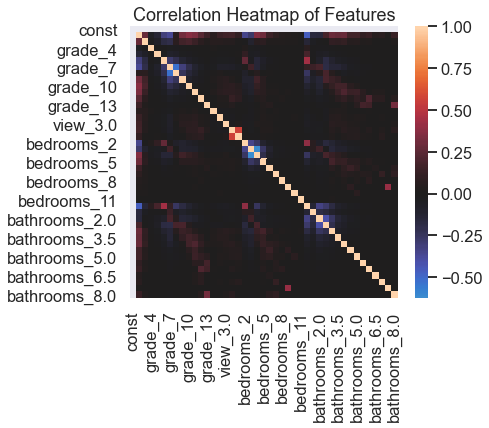

B-P het-sced Test p-value: 0.0


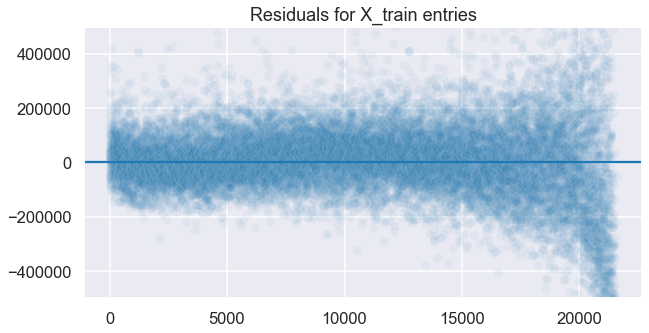

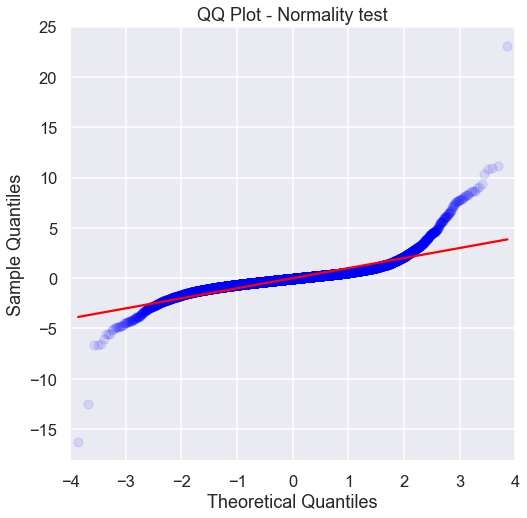

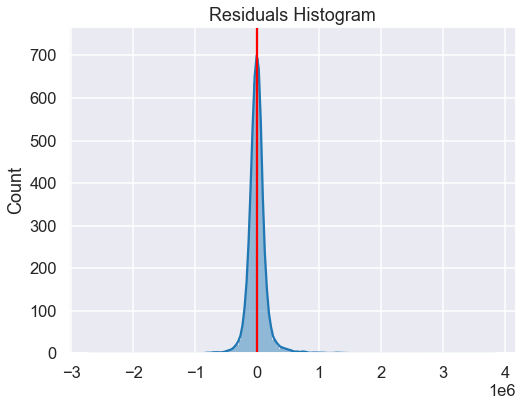

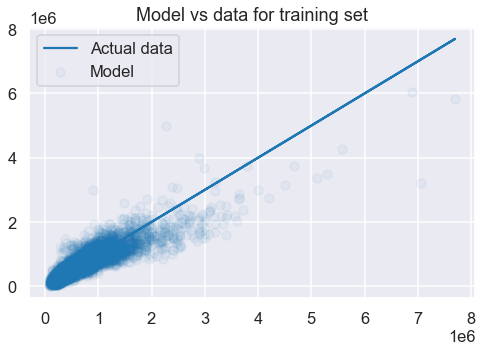

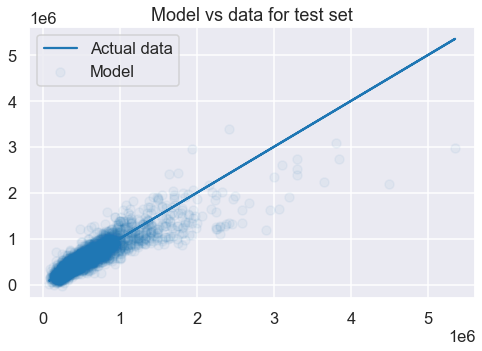

Train vs Test bias:
3.4507407384583236e-11 | -2263.1016695320704
Train vs Test variance:
106279079994.02283 | 106244563177.05975



In [306]:
# So zip_rank seems to greatly outperform dt_lat

# Let's try one-hot-encoding some of the features from earlier:
cats = ['grade', 'view', 'waterfront', 'bedrooms', 'bathrooms']
X8_ohe = pd.get_dummies(df2[cats].astype('object'), prefix=cats, drop_first=True)
X8_proc = pd.concat([X9, X8_ohe], axis=1)

model2c = check_model_zip(X8_proc, y)

Cross-validation R-squared mean: 0.8312134487616578
Cross-validation MSE mean: 0.04673984179616779
OLS Model Summary for Training Set:


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     2051.
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        14:25:25   Log-Likelihood:                 1987.6
No. Observations:               17273   AIC:                            -3891.
Df Residuals:                   17231   BIC:                            -3565.
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              2.9395      0.312      9.431      0.000       2.329       3.550
sqft_living        0.0002    3.8e-06     53.649      0.000       0.000       0.000
zip_rank          10.8179      0.069    157.078      0.000      10.683      10.953
grade_4           -0.5306      0.221     -2.396      0.017      -0.965      -0.096
grade_5           -0.4188      0.217     -1.929      0.054      -0.844       0.007
grade_6           -0.2831      0.217     -1.306      0.192      -0.708       0.142
grade_7           -0.1759      0.217     -0.811      0.417      -0.601       0.249
grade_8           -0.0964      0.217     -0.445      0.656      -0.521       0.328
grade_9            0.0048      0.217      0.022      0.982      -0.420       0.430
grade_10           0.0467      0.217      0.215      0.830      -0.379       0.472
grade_11           0.1008      0.217      0.464      0.643      -0.325       0.527
grade_12           0.1645      0.219      0.751      0.452      -0.265       0.594
grade_13           0.3557      0.229      1.550      0.121      -0.094       0.805
view_1.0           0.1616      0.014     11.623      0.000       0.134       0.189
view_2.0           0.1648      0.008     19.939      0.000       0.149       0.181
view_3.0           0.2331      0.011     21.193      0.000       0.212       0.255
view_4.0           0.3824      0.017     22.175      0.000       0.349       0.416
waterfront_1.0     0.3832      0.024     16.092      0.000       0.337       0.430
bedrooms_2         0.0269      0.019      1.452      0.147      -0.009       0.063
bedrooms_3         0.0110      0.019      0.595      0.552      -0.025       0.047
bedrooms_4         0.0238      0.019      1.259      0.208      -0.013       0.061
bedrooms_5        -0.0044      0.020     -0.223      0.823      -0.044       0.035
bedrooms_6        -0.0104      0.025     -0.419      0.675      -0.059       0.038
bedrooms_7        -0.1245      0.045     -2.769      0.006      -0.213      -0.036
bedrooms_8        -0.0574      0.072     -0.803      0.422      -0.198       0.083
bedrooms_9         0.0232      0.099      0.234      0.815      -0.171       0.218
bedrooms_10       -0.5963      0.219     -2.718      0.007      -1.026      -0.166
bedrooms_11        0.2876      0.217      1.326      0.185      -0.138       0.713
bathrooms_1.0      0.0320      0.217      0.148      0.883      -0.393       0.457
bathrooms_1.5      0.0226      0.217      0.104      0.917      -0.402       0.448
bathrooms_2.0      0.0433      0.217      0.200      0.842      -0.382       0.468
bathrooms_2.5      0.0232      0.217      0.107      0.915      -0.402       0.448
bathrooms_3.0      0.0749      0.217      0.345      0.730      -0.350       0.500
bathrooms_3.5      0.0582      0.217      0.268      0.788      -0.367       0.484
bathrooms_4.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 43 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   const           21592 non-null  float64
 1   sqft_living     21592 non-null  int64  
 2   zip_rank        21592 non-null  float64
 3   grade_4         21592 non-null  uint8  
 4   grade_5         21592 non-null  uint8  
 5   grade_6         21592 non-null  uint8  
 6   grade_7         21592 non-null  uint8  
 7   grade_8         21592 non-null  uint8  
 8   grade_9         21592 non-null  uint8  
 9   grade_10        21592 non-null  uint8  
 10  grade_11        21592 non-null  uint8  
 11  grade_12        21592 non-null  uint8  
 12  grade_13        21592 non-null  uint8  
 13  view_1.0        21592 non-null  uint8  
 14  view_2.0        21592 non-null  uint8  
 15  view_3.0        21592 non-null  uint8  
 16  view_4.0        21592 non-null  uint8  
 17  waterfront_1.0  21592 non-null 

None

,const,sqft_living,zip_rank,grade_4,grade_5,grade_6,grade_7,grade_8,grade_9,grade_10,...,bathrooms_3.5,bathrooms_4.0,bathrooms_4.5,bathrooms_5.0,bathrooms_5.5,bathrooms_6.0,bathrooms_6.5,bathrooms_7.0,bathrooms_7.5,bathrooms_8.0
count,21592.0,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,...,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000
mean,1.0,2080.365228,0.899738,0.001250,0.011208,0.094387,0.415432,0.280891,0.121110,0.052519,...,0.033855,0.017136,0.004631,0.002640,0.000463,0.000556,0.000093,0.000093,0.000046,0.000139
std,0.0,918.177240,0.026199,0.035341,0.105275,0.292373,0.492808,0.449445,0.326262,0.223077,...,0.180860,0.129781,0.067898,0.051313,0.021516,0.023569,0.009624,0.009624,0.006805,0.011787
min,1.0,370.000000,0.850001,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.0,1430.000000,0.878122,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.0,1910.000000,0.901238,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.0,2550.000000,0.916408,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.0,13540.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


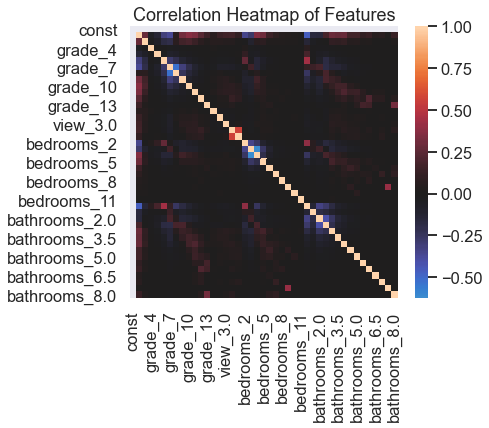

B-P het-sced Test p-value: 5.9399364151756555e-161


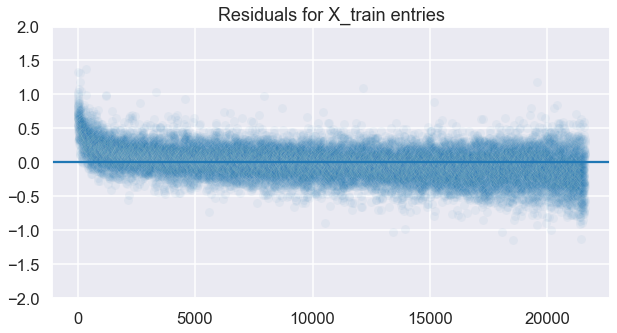

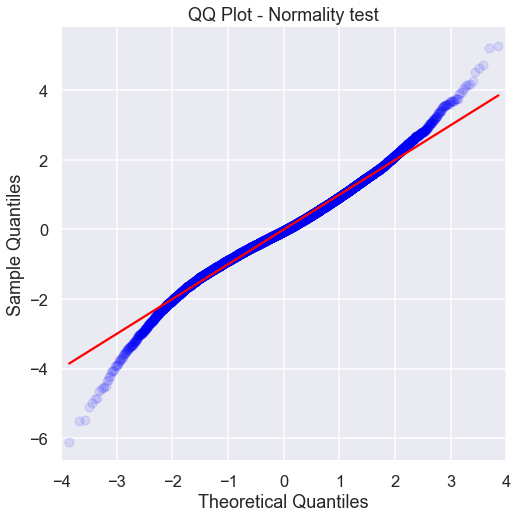

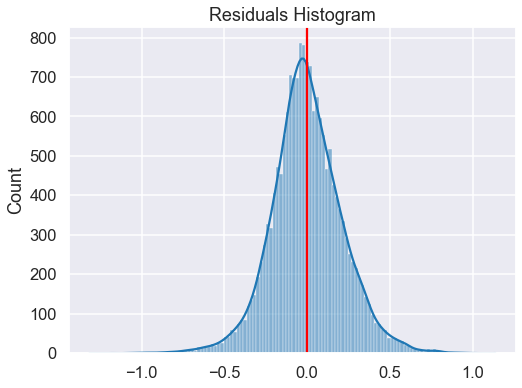

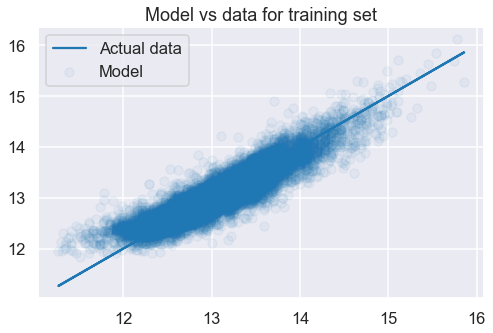

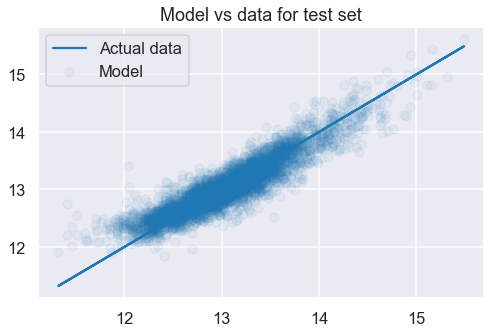

Train vs Test bias:
-2.0535108764629307e-15 | 0.0037047675706888554
Train vs Test variance:
0.22705032739727926 | 0.2435737684909327



In [307]:
model2c_log = check_model_zip(X8_proc, ylog)

Cross-validation R-squared mean: 0.7330952035507596
Cross-validation MSE mean: 36080041585.59886
OLS Model Summary for Training Set:


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.731
Model:                            OLS   Adj. R-squared:                  0.731
Method:                 Least Squares   F-statistic:                     6717.
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        14:25:28   Log-Likelihood:            -2.3444e+05
No. Observations:               17273   AIC:                         4.689e+05
Df Residuals:                   17265   BIC:                         4.690e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -5.493e+06   5.11e+04   -107.419      0.000   -5.59e+06   -5.39e+06
zip_rank        6.203e+06   5.77e+04    107.420      0.000    6.09e+06    6.32e+06
sqft_adj        2.071e+05   1702.227    121.648      0.000    2.04e+05     2.1e+05
view_1.0        1.077e+05   1.22e+04      8.835      0.000    8.38e+04    1.32e+05
view_2.0        1.105e+05   7226.268     15.286      0.000    9.63e+04    1.25e+05
view_3.0        2.046e+05   9609.796     21.295      0.000    1.86e+05    2.23e+05
view_4.0        3.594e+05    1.5e+04     23.892      0.000     3.3e+05    3.89e+05
waterfront_1.0  6.064e+05   2.08e+04     29.132      0.000    5.66e+05    6.47e+05
==============================================================================
Omnibus:                    16512.977   Durbin-Watson:                   2.014
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          2730399.161
Skew:                           4.175   Prob(JB):                         0.00
Kurtosis:                      64.025   Cond. No.                         139.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   const           21592 non-null  float64
 1   zip_rank        21592 non-null  float64
 2   sqft_adj        21592 non-null  float64
 3   view_1.0        21592 non-null  uint8  
 4   view_2.0        21592 non-null  uint8  
 5   view_3.0        21592 non-null  uint8  
 6   view_4.0        21592 non-null  uint8  
 7   waterfront_1.0  21592 non-null  uint8  
dtypes: float64(3), uint8(5)
memory usage: 1.4 MB


None

,const,zip_rank,sqft_adj,view_1.0,view_2.0,view_3.0,view_4.0,waterfront_1.0
count,21592.0,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000
mean,1.0,0.899738,2.080365,0.015283,0.044322,0.023527,0.014681,0.006762
std,0.0,0.026199,0.918177,0.122681,0.205814,0.151574,0.120277,0.081953
min,1.0,0.850001,0.370000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.0,0.878122,1.430000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.0,0.901238,1.910000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.0,0.916408,2.550000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.0,1.000000,13.540000,1.000000,1.000000,1.000000,1.000000,1.000000


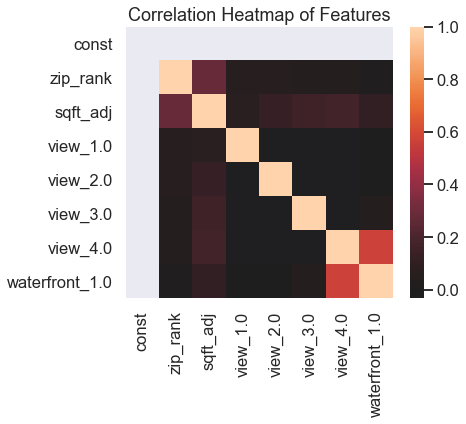

B-P het-sced Test p-value: 0.0


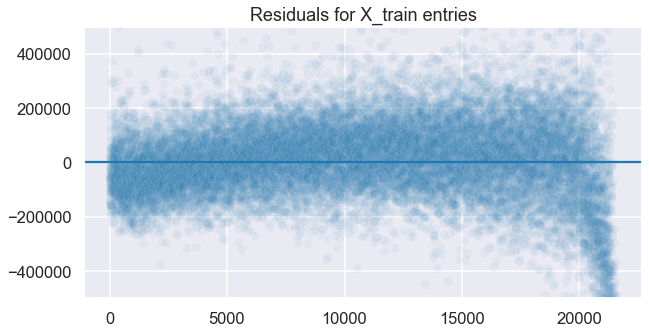

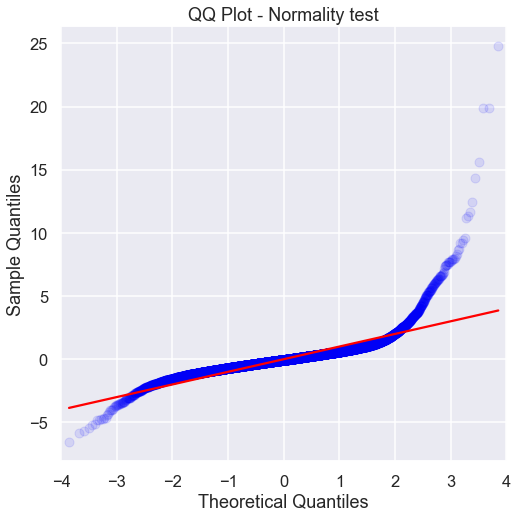

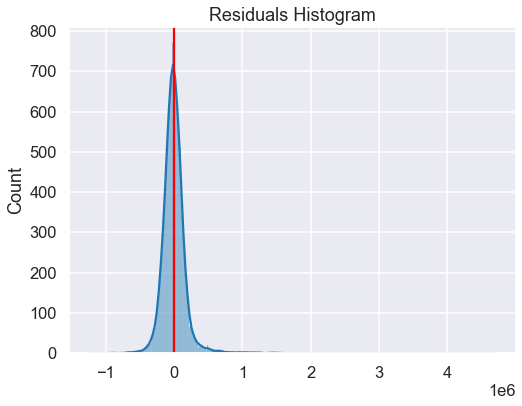

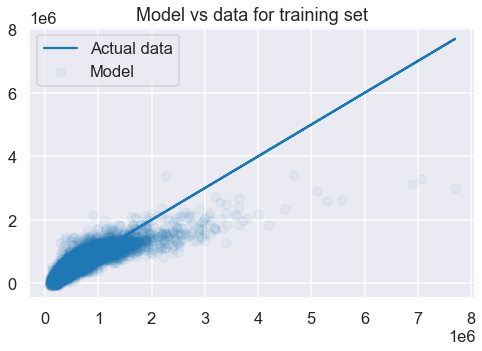

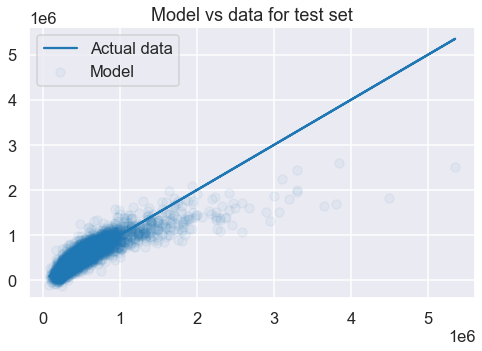

Train vs Test bias:
-1.401863424998694e-12 | -3786.0181432467384
Train vs Test variance:
98074182638.341 | 100379427564.5639



In [308]:
# Grade/beds/baths have high p-values, so let's drop those
cats = ['view', 'waterfront']
X8_ohe = pd.get_dummies(df2[cats].astype('object'), prefix=cats, drop_first=True)

# Since the condition numbers are high, I'll adjust the sqft_living by dividing by 1000
# to bring the values down to similar scales as the other features 
X9['sqft_adj'] = X7['sqft_living'] / 1000
X10 = pd.concat([X9.drop('sqft_living', axis=1), X8_ohe], axis=1)

model2d = check_model_zip(X10, y)

Cross-validation R-squared mean: 0.8137163603675799
Cross-validation MSE mean: 0.051595611947610885
OLS Model Summary for Training Set:


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.812
Model:                            OLS   Adj. R-squared:                  0.812
Method:                 Least Squares   F-statistic:                 1.062e+04
Date:                Tue, 08 Jun 2021   Prob (F-statistic):               0.00
Time:                        14:25:32   Log-Likelihood:                 1100.4
No. Observations:               17273   AIC:                            -2185.
Df Residuals:                   17265   BIC:                            -2123.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              2.0683      0.061     33.805      0.000       1.948       2.188
zip_rank          11.5329      0.069    166.927      0.000      11.397      11.668
sqft_adj           0.2788      0.002    136.895      0.000       0.275       0.283
view_1.0           0.1586      0.015     10.874      0.000       0.130       0.187
view_2.0           0.1745      0.009     20.182      0.000       0.158       0.191
view_3.0           0.2565      0.011     22.309      0.000       0.234       0.279
view_4.0           0.3931      0.018     21.842      0.000       0.358       0.428
waterfront_1.0     0.3661      0.025     14.702      0.000       0.317       0.415
==============================================================================
Omnibus:                      944.570   Durbin-Watson:                   2.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3325.775
Skew:                          -0.178   Prob(JB):                         0.00
Kurtosis:                       5.120   Cond. No.                         139.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21592 entries, 0 to 21596
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   const           21592 non-null  float64
 1   zip_rank        21592 non-null  float64
 2   sqft_adj        21592 non-null  float64
 3   view_1.0        21592 non-null  uint8  
 4   view_2.0        21592 non-null  uint8  
 5   view_3.0        21592 non-null  uint8  
 6   view_4.0        21592 non-null  uint8  
 7   waterfront_1.0  21592 non-null  uint8  
dtypes: float64(3), uint8(5)
memory usage: 1.4 MB


None

,const,zip_rank,sqft_adj,view_1.0,view_2.0,view_3.0,view_4.0,waterfront_1.0
count,21592.0,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000,21592.000000
mean,1.0,0.899738,2.080365,0.015283,0.044322,0.023527,0.014681,0.006762
std,0.0,0.026199,0.918177,0.122681,0.205814,0.151574,0.120277,0.081953
min,1.0,0.850001,0.370000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.0,0.878122,1.430000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.0,0.901238,1.910000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.0,0.916408,2.550000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.0,1.000000,13.540000,1.000000,1.000000,1.000000,1.000000,1.000000


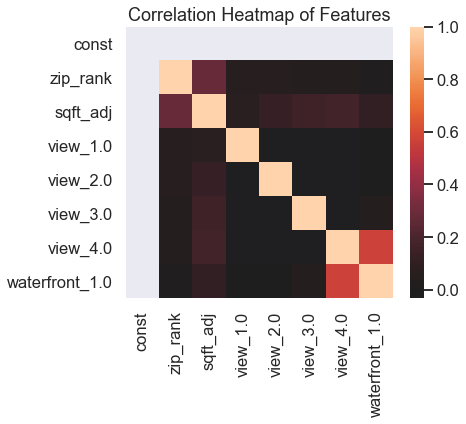

B-P het-sced Test p-value: 4.082416689618271e-74


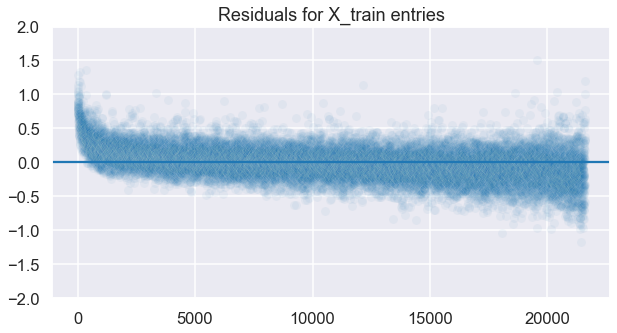

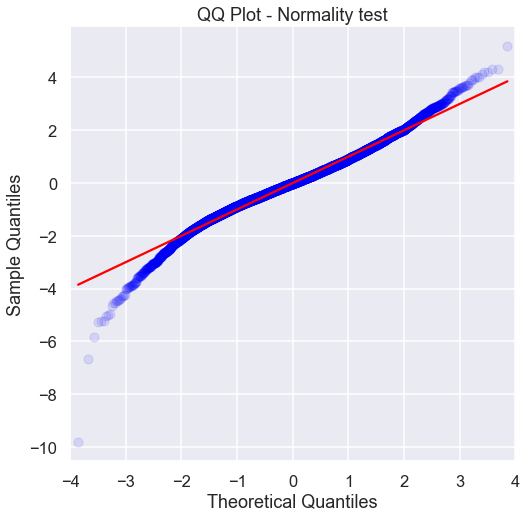

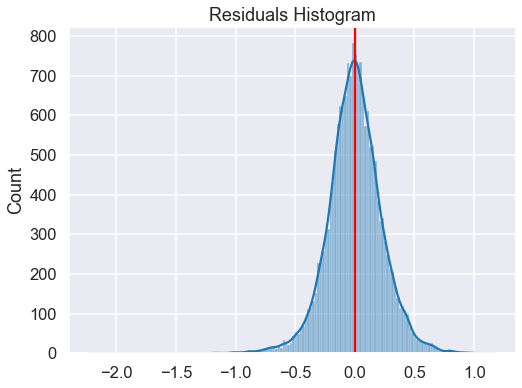

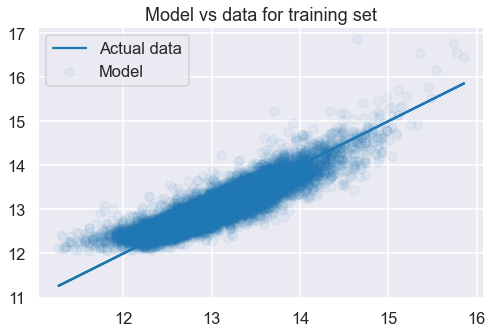

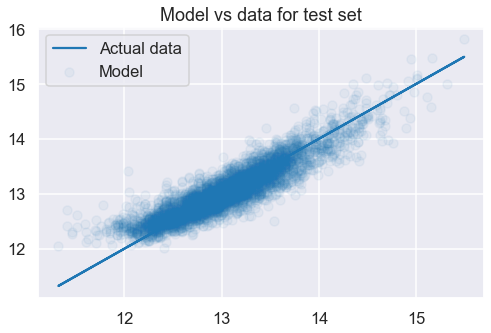

Train vs Test bias:
9.32759597832471e-17 | 0.0058578835718708895
Train vs Test variance:
0.22201822560049322 | 0.23630273085012732



In [309]:
model2d_log = check_model_zip(X10, ylog)

In [310]:
# The only multi-collinearity is between View_4.0 and Waterfront_1.0
# This makes some sense, as super-high view values would probably correlate with waterfront properties

display(data[(data['view'] == 4)].waterfront.value_counts())
print('Median price of waterfront houses with view=4:', \
      data[(data['view'] == 4) & (data['waterfront'] == 1)].price.median())
print('Median price of non-waterfront houses with view=4:', \
      data[(data['view'] == 4) & (data['waterfront'] == 0)].price.median())

0.0    194
1.0    123
Name: waterfront, dtype: int64

Median price of waterfront houses with view=4: 1600000.0
Median price of non-waterfront houses with view=4: 1065000.0


In [311]:
# There are still more view=4 houses that aren't waterfront than not, and being waterfront increases
# the median price by $535,000 - so I think we're safe to keep Waterfront in the model.

In [312]:
# All these models are in the same ballpark, with very good R-squared values,
# relatively low multi-collinearity, and acceptable heteroscedasticity (discussed below).

In [313]:
X10.zip_rank.describe()

count    21592.000000
mean         0.899738
std          0.026199
min          0.850001
25%          0.878122
50%          0.901238
75%          0.916408
max          1.000000
Name: zip_rank, dtype: float64

<a id="interpret"></a>
## V. Interpret Data
[Back to Top](#contents) | [Previous Section](#model) | [Next Section](#conclusions)

### Overall thoughts

* Overall, I attempted to use untransformed price, and although I achieved respectable R-squared values, there were always problems with normality and variance (heteroscedasticity) of residuals. This was mostly solved by using the log-transformed price as a target.
* Even so, heteroscedasticity remains a problem, though judging by the visual plots, the residuals are **mostly** homoscedastic, but the very low and very high ends are skewed.
* Thus, the most successful models come with the caveat that they are less accurate for homes with 'actual' prices below ~150,000 (e^12) and above 1.5 million (e^14).
* Otherwise, I think I was pretty successful in using all the available data entries after data cleaning, except for one entry with 33(!) bedrooms, and 4 entries that are either invalid/not homes, or had bad data, which was signified by the lot sqft being less than the sqft of a single floor of the house (the house 'footprint'). Otherwise, I was able to deal with missing or NaN values in the dataset.


* **Update!** After reworking zip_rank, the R^2 (both for cross-val and the training model) increased quite a bit, from .77 to .81; I changed the formula to use the mean housing price (instead of median) and used the price_log instead of price; this created different ranks, ranging from .85 to 1.0; and it's more robust statistically, as the ranks were only calculated using the price_log values from the training set, and then the test set was assigned those ranks. The final result is a more accurate and more robust model.

<a id="conclusions"></a>
## VI. Conclusions
[Back to Top](#contents) | [Previous Section](#interpret) | [Next Section](#appendix)

Here I'll give my recommendations to the hypothetical website.

#### 1. What features are the best predictors of home price?

I recommend using `zip_rank` and `sqft_adj`, in addition to the encoded view and waterfront features. Of these, the engineered feature `zip_rank` is very good in conjuction with `sqft_adj` to predict price, as it incorporates location data with price data from that area.

#### 2. What is the most understandable/useable model that can be built with those predictors?

The final model (model2d_log) I think is very understandable, as `sqft_adj` and the `zip_rank` values are pretty straightforward. The encoded `view` and `waterfront` coefficient values also make sense, as the higher `view` values have progressively higher coefficients; just using the raw numeric 1.0/2.0/etc values for `view` doesn't suffice.

#### 3. What tools can be built using this model?

Besides giving users a ballpark home value price based on their data, it would be simple to build a tool to show potential value increases based on increases in square footage, perhaps even using certain values to represent 'bathroom' or 'bedroom' room sizes, or suggesting areas of the house that can be converted to living space, i.e. unfinished basements/attics/garages/etc.

To deal with users not knowing their `view` values, one could suggest a value based on houses in their neighborhood, as houses on the same street/block would all likely have similar view scores.

#### 4. What additional functions could be developed to make this better or keep it relevant in the future?

`zip_rank` can be continually updated as houses are sold over time, by simply re-calculating the median home prices, and using the same manner of converting to a rank based on the zipcode with the highest median house price.

<a id="appendix"></a>
## VII. Appendix - extra visualizations
[Back to Top](#contents) | [Previous Section](#conclusions)

In [246]:
# Here I'll create some visualizations for demonstrating my findings:
# Predicted home values for various square footage, for a given view/waterfront/zip_rank profile

In [321]:
# First, for homes at .9 zip_rank, and 1500-2500 sqft
x1a = np.e**float(model2d_log.predict([1, .9, 1.5, 0,0,0,0,0]))
x1b = np.e**float(model2d_log.predict([1, .9, 1.75, 0,0,0,0,0]))
x1c = np.e**float(model2d_log.predict([1, .9, 2, 0,0,0,0,0]))
x1d = np.e**float(model2d_log.predict([1, .9, 2.25, 0,0,0,0,0]))
x1e = np.e**float(model2d_log.predict([1, .9, 2.5, 0,0,0,0,0]))
x1 = [x1a, x1b, x1c, x1d, x1e]
x1_increase = [x1[i] - x1[0] for i in range(1,5)]

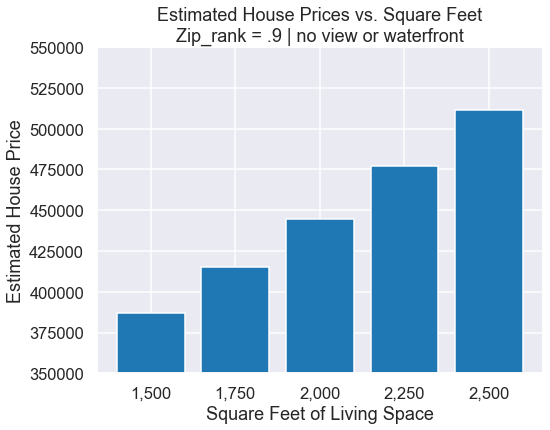

In [340]:
fig = plt.figure(figsize=(8,6))
ax = fig.gca()
plt.bar(x=[0,1,2,3,4], height=x1)
plt.ylim(350000,550000)
ax.set_xticks([0, 1, 2, 3, 4])
ax.set_xticklabels(['1,500', '1,750', '2,000', '2,250', '2,500'])
plt.xlabel('Square Feet of Living Space')
plt.ylabel('Estimated House Price')
plt.title('Estimated House Prices vs. Square Feet\nZip_rank = .9 | no view or waterfront')
plt.savefig("images/figure2a.png");

In [327]:
# And now high-end homes: zip_rank .5, 2000-3000 sqft, and view of 1.0
x2a = np.e**float(model2d_log.predict([1, .96, 2, 0,1,0,0,0]))
x2b = np.e**float(model2d_log.predict([1, .96, 2.25, 0,1,0,0,0]))
x2c = np.e**float(model2d_log.predict([1, .96, 2.5, 0,1,0,0,0]))
x2d = np.e**float(model2d_log.predict([1, .96, 2.75, 0,1,0,0,0]))
x2e = np.e**float(model2d_log.predict([1, .96, 3, 0,1,0,0,0]))
x2 = [x2a, x2b, x2c, x2d, x2e]
x2_increase = [x2[i] - x2[0] for i in range(1,5)]

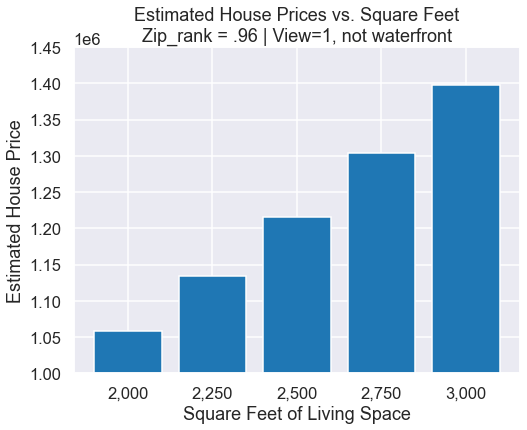

In [339]:
fig = plt.figure(figsize=(8,6))
plt.bar([0,1,2,3,4], x2)
plt.ylim(1000000,1450000)
ax = fig.gca()
ax.set_xticks([0, 1, 2, 3, 4])
ax.set_xticklabels(['2,000', '2,250', '2,500', '2,750', '3,000'])
plt.xlabel('Square Feet of Living Space')
plt.ylabel('Estimated House Price')
plt.title('Estimated House Prices vs. Square Feet\nZip_rank = .96 | View=1, not waterfront')
plt.savefig("images/figure2b.png");

In [331]:
ex_data = {}
ex_data['Price increase'] = x1_increase + x2_increase
ex_data['Sqft increase'] = [250, 500, 750, 1000, 250, 500, 750, 1000]
ex_data['Home category'] = ['1,500 sqft, zip_rank .9', '1,500 sqft, zip_rank .9', '1,500 sqft, zip_rank .9', \
                           '1,500 sqft, zip_rank .9', '2,000 sqft, zip_rank .96', '2,000 sqft, zip_rank .96', \
                           '2,000 sqft, zip_rank .96', '2,000 sqft, zip_rank .96']
sqft_tool = pd.DataFrame(ex_data)

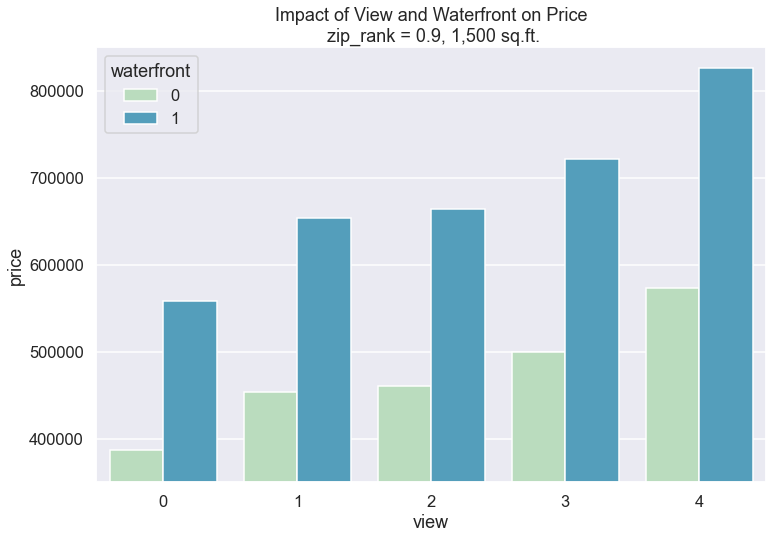

In [338]:
# Visualize the impact of higher view values, as well as waterfront.

x3a = [1, .9, 1.5, 0, 0, 0, 0, 0]
x3b = [1, .9, 1.5, 0, 0, 0, 0, 1]
x3c = [1, .9, 1.5, 1, 0, 0, 0, 0]
x3d = [1, .9, 1.5, 1, 0, 0, 0, 1]
x3e = [1, .9, 1.5, 0, 1, 0, 0, 0]
x3f = [1, .9, 1.5, 0, 1, 0, 0, 1]
x3g = [1, .9, 1.5, 0, 0, 1, 0, 0]
x3h = [1, .9, 1.5, 0, 0, 1, 0, 1]
x3i = [1, .9, 1.5, 0, 0, 0, 1, 0]
x3j = [1, .9, 1.5, 0, 0, 0, 1, 1]
x3 = [x3a, x3b, x3c, x3d, x3e, x3f, x3g, x3h, x3i, x3j]

x3_prices = [np.e**float(model2d_log.predict(x)) for x in x3]
ex_view = {}
ex_view['price'] = x3_prices
ex_view['view'] = [0, 0, 1, 1, 2, 2, 3, 3, 4, 4]
ex_view['waterfront'] = [0, 1, 0, 1, 0, 1, 0, 1, 0, 1]
view_df = pd.DataFrame(ex_view)

plt.figure(figsize=(12,8))
sns.barplot(x='view', y='price', hue='waterfront', data=view_df, palette='GnBu')
plt.title('Impact of View and Waterfront on Price\n zip_rank = 0.9, 1,500 sq.ft.')
plt.ylim(350000, 850000)
plt.savefig("images/figure4.png");

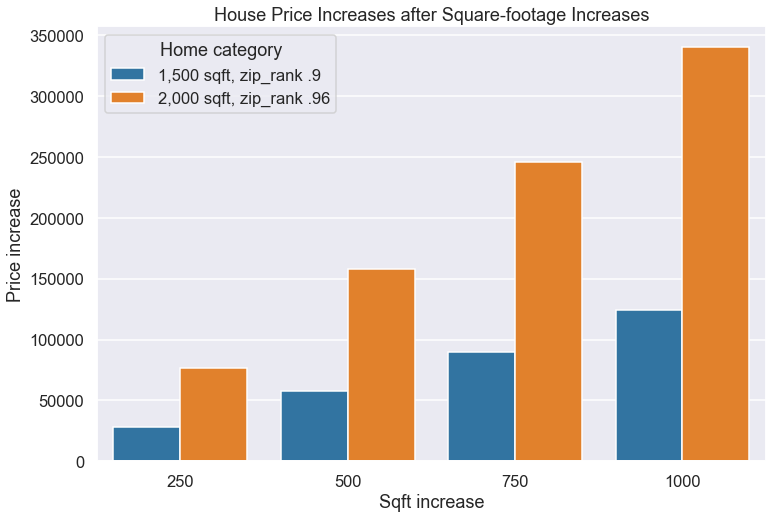

In [334]:
# Now let's plot price increases based on sqft increases, for each category
plt.figure(figsize=(12,8))
sns.barplot(x='Sqft increase', y='Price increase', hue='Home category', data=sqft_tool)
plt.title('House Price Increases after Square-footage Increases')
plt.savefig("images/figure3.png");

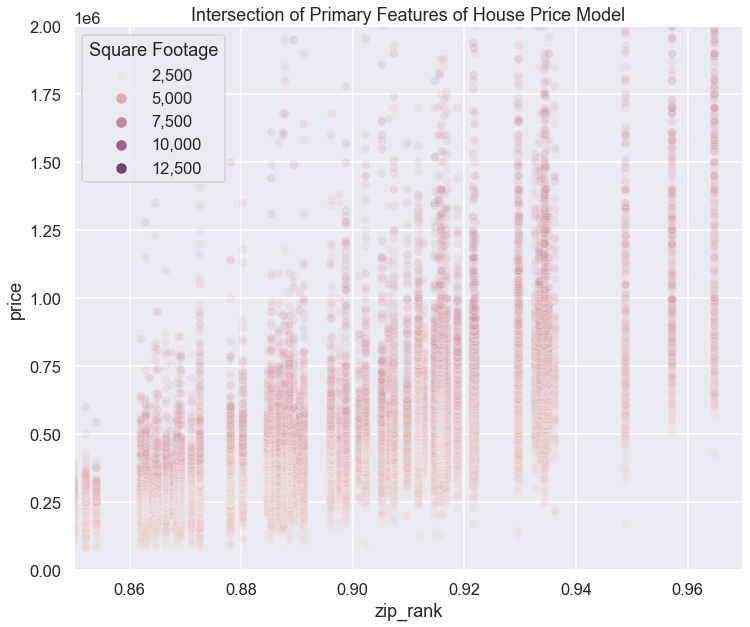

In [337]:
# Finally, a plot to show the power of using zip_rank and sqft_adj to predict price,
# and the stratification of sqft using the 'hue' feature
plt.figure(figsize=(12,10))
sns.scatterplot(x=X10.zip_rank, y=y, hue=X10.sqft_adj, alpha=.15)
plt.xlim(.85,.97)
plt.ylim(0,2000000)
plt.legend(title='Square Footage', labels=['2,500', '5,000', '7,500', '10,000', '12,500'])
plt.title('Intersection of Primary Features of House Price Model')
plt.savefig("images/figure1.png");